# План домашних заданий


- Описание задачи и знакомство с данными
- Домашнее задание 1. Генерация и фильтрация признаков
- Домашнее задание 2. Прогноз времени и вида поломки машин, настройка ML-модели
- Дополнительное задание. Визуализация прогнозов, ошибок модели и важности признаков
- Домашнее задание 3. Оптимизация. Тюнинг гиперпараметров с помощью `Optuna`
- Домашнее задание 4. Блендинг
- Домашнее задание 5. Парсинг внешних данных и оптимизация памяти
- Отправка финального решения на лидерборд на Kaggle

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# <center id="part0"> Описание задачи

**Предыстория:**  мы работаем с каршеринговой компанией, которая управляет крупным автопарком машин. Наша цель — предотвратить длительные периоды простоя машин из-за поломок через своевременное обслуживание и ремонт.


**Идея для решения проблемы:** создать приоритизированный список обхода машин. Этот список поможет технической бригаде сосредоточиться на автомобилях, которые наиболее вероятно выйдут из строя в ближайшее время.


**Как компания решает задачу:**

* Собирает данные о поездках и состоянии машин до поломок.

* Нанимает Data Scientist, чтобы он смог использовать эти данные для анализа и прогнозирования характера поломок.

**Важный момент**: задачи этого специалиста (Data Scientist) предстоит выполнять вам.

## <center> Знакомство с данными

### Информация про машины с таргетом (основной датасет)

In [2]:
car_train = pd.read_csv('https://raw.githubusercontent.com/a-milenkin/Competitive_Data_Science/main/data/car_train.csv')
car_train.sample(5)

,car_id,model,car_type,fuel_type,car_rating,year_to_start,riders,year_to_work,target_reg,target_class
1081,f15758729f,Renault Kaptur,standart,petrol,3.26,2015,76080,2017,37.40,break_bug
1571,x-8009442a,Smart ForTwo,economy,petrol,4.58,2015,81205,2015,28.36,engine_fuel
812,c17052193e,Nissan Qashqai,standart,petrol,3.28,2014,67583,2016,53.62,engine_check
1201,z-1432906b,VW Polo VI,economy,petrol,5.22,2015,85739,2015,33.62,engine_overheat
58,F-1257166O,Kia Rio X,economy,petrol,5.12,2012,19918,2015,34.74,engine_overheat


- `car_id` — идентификатор машины
- `model` / `car_type` / `fuel_type` — марка, класс и тип топлива машины
- `car_rating` / `riders` — общий рейтинг и общее число поездок к концу 2021 года
- `year_to_start` / `year_to_work` — год выпуска машины и год начала работы в автопарке
- `target_reg` — количество дней до поломки
- `target_class` — класс поломки (всего 9 видов)

In [3]:
car_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2337 entries, 0 to 2336
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   car_id         2337 non-null   object 
 1   model          2337 non-null   object 
 2   car_type       2337 non-null   object 
 3   fuel_type      2337 non-null   object 
 4   car_rating     2337 non-null   float64
 5   year_to_start  2337 non-null   int64  
 6   riders         2337 non-null   int64  
 7   year_to_work   2337 non-null   int64  
 8   target_reg     2337 non-null   float64
 9   target_class   2337 non-null   object 
dtypes: float64(2), int64(3), object(5)
memory usage: 182.7+ KB


In [4]:
car_train['car_id'].nunique()

2337

### Информация про поездки

In [5]:
rides_info = pd.read_csv('https://raw.githubusercontent.com/a-milenkin/Competitive_Data_Science/main/data/rides_info.csv')
rides_info.sample(5)

,user_id,car_id,ride_id,ride_date,rating,ride_duration,ride_cost,speed_avg,speed_max,stop_times,distance,refueling,user_ride_quality,deviation_normal
612836,Y10471095C,r-6401544e,p1V,2020-01-05,1.66,30,326,41,74.000000,1,82.624065,0,6.167035,2.276
126880,j14188605i,I69261244y,U1c,2020-01-19,7.83,9,85,47,85.589933,0,472.534772,0,2.817273,33.146
208125,Y22591876m,O19079001s,C1j,2020-01-12,6.93,28,253,37,47.000000,1,673.278845,0,7.169362,-2.105
433560,B32933355G,e22337672e,O1W,2020-03-07,5.38,57,736,34,65.000000,2,1592.525109,0,12.235481,-4.298
459458,Y19480377s,g11810192a,C1e,2020-02-22,4.68,21,286,51,108.000000,0,747.556766,0,4.453853,-0.728


- `user_id` / `car_id` / `ride_id` — идентификаторы водителя, машины, поездки соответственно
- `ride_date` / `rating` — дата поездки и рейтинг, поставленный водителем
- `ride_duration` / `distance` / `ride_cost` —  длительность (время),  пройденное расстояние, стоимость поездки
- `speed_avg` / `speed_max` — средняя и максимальная скорости поездки соответственно
- `stop_times` / `refueling` — количество остановок (паузы) и флаг: была ли дозаправка
- `user_ride_quality` — оценка манеры вождения водителя машины, определенная скоринговой ML-системой сервиса
- `deviation_normal` — общий показатель датчиков о состоянии машины, относительно эталонных показателей (нормы)

In [6]:
# Информация о датафрейме. 739_500 строк, 14 колонок, пропущенные значения есть в колонках speed_max и user_ride_quality
rides_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 739500 entries, 0 to 739499
Data columns (total 14 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   user_id            739500 non-null  object 
 1   car_id             739500 non-null  object 
 2   ride_id            739500 non-null  object 
 3   ride_date          739500 non-null  object 
 4   rating             739500 non-null  float64
 5   ride_duration      739500 non-null  int64  
 6   ride_cost          739500 non-null  int64  
 7   speed_avg          739500 non-null  int64  
 8   speed_max          736139 non-null  float64
 9   stop_times         739500 non-null  int64  
 10  distance           739500 non-null  float64
 11  refueling          739500 non-null  int64  
 12  user_ride_quality  736872 non-null  float64
 13  deviation_normal   739500 non-null  float64
dtypes: float64(5), int64(5), object(4)
memory usage: 79.0+ MB


In [7]:
# Дубликатов нет
rides_info.duplicated().sum()

0

In [8]:
rides_info.duplicated(subset=['user_id', 'car_id', 'ride_id']).sum()

0

In [9]:
rides_info['user_id'].nunique()

15153

In [10]:
rides_info['ride_id'].nunique()

2704

In [11]:
rides_info['car_id'].nunique()

4250

### Информация про водителей

In [12]:
driver_info = pd.read_csv('https://raw.githubusercontent.com/a-milenkin/Competitive_Data_Science/main/data/driver_info.csv')
driver_info.sample(5)

,age,user_rating,user_rides,user_time_accident,user_id,sex,first_ride_date
7558,28,9.9,1173,12.0,F58875524D,1,2020-12-17
10048,36,7.8,774,3.0,y63851097t,0,2019-4-23
13028,37,7.6,655,4.0,F72396035M,0,2019-5-24
1030,34,7.8,92,9.0,F11801062q,0,2019-10-21
14107,54,8.2,1078,63.0,S21992542q,0,2019-2-6


- `user_id` / `age` / `sex` — идентификатор, возраст и пол водителя, соответственно
- `user_rating` — общий рейтинг пользователя за все поездки к концу 2021 года
- `user_rides` — общее количество поездок к концу 2021 года
- `user_time_accident` — число инцидентов (это могли быть аварии/штрафы/эвакуация машины)  
- `first_ride_date` — дата первой поездки

In [13]:
driver_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15153 entries, 0 to 15152
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   age                 15153 non-null  int64  
 1   user_rating         15153 non-null  float64
 2   user_rides          15153 non-null  int64  
 3   user_time_accident  14182 non-null  float64
 4   user_id             15153 non-null  object 
 5   sex                 15153 non-null  int64  
 6   first_ride_date     15153 non-null  object 
dtypes: float64(2), int64(3), object(2)
memory usage: 828.8+ KB


In [14]:
driver_info['user_id'].nunique()

15153

In [15]:
driver_info[driver_info['user_id'] == 'D10082142F']

,age,user_rating,user_rides,user_time_accident,user_id,sex,first_ride_date
4249,23,8.5,0,NaN,D10082142F,1,2020-2-12


In [16]:
driver_info.describe()

,age,user_rating,user_rides,user_time_accident,sex
count,15153.000000,15153.000000,15153.000000,14182.000000,15153.000000
mean,33.581073,8.109345,871.015442,10.129601,0.499967
std,9.919271,0.668246,573.512378,8.867482,0.500016
min,18.000000,5.800000,0.000000,0.000000,0.000000
25%,25.000000,7.700000,421.000000,4.000000,0.000000
50%,33.000000,8.100000,876.000000,9.000000,0.000000
75%,41.000000,8.600000,1145.000000,14.000000,1.000000
max,63.000000,10.000000,3316.000000,86.000000,1.000000


In [17]:
driver_info['user_time_accident'] = driver_info['user_time_accident'].fillna(0)

In [18]:
driver_info[driver_info['user_time_accident'].isnull()]

,age,user_rating,user_rides,user_time_accident,user_id,sex,first_ride_date


### Информация про ремонт машин

In [19]:
fix_info = pd.read_csv('https://raw.githubusercontent.com/a-milenkin/Competitive_Data_Science/main/data/fix_info.csv')
fix_info.sample(5)

,car_id,worker_id,fix_date,work_type,destroy_degree,work_duration
97743,Z-2276652N,UW,2019-4-19 17:57,repair,4.8,7
100894,r78044474N,PB,2019-6-24 4:47,reparking,1.0,21
90748,j-1712772o,HP,2018-4-26 2:52,repair,5.0,48
113335,x-6745292f,XT,2019-3-2 8:15,reparking,1.0,30
111587,c-1038656M,SJ,2019-1-23 3:39,reparking,1.0,22


- `worker_id` / `car_id` — идентификатор работника и машины
- `work_type` / `work_duration` — тип и длительность (в часах) проводимой работы
- `destroy_degree` — степень износа/поврежденности машины в случае поломки
- `fix_date` — время начала ремонта (снятия машины с линии)

In [20]:
fix_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 146000 entries, 0 to 145999
Data columns (total 6 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   car_id          146000 non-null  object 
 1   worker_id       146000 non-null  object 
 2   fix_date        146000 non-null  object 
 3   work_type       146000 non-null  object 
 4   destroy_degree  146000 non-null  float64
 5   work_duration   146000 non-null  int64  
dtypes: float64(1), int64(1), object(4)
memory usage: 6.7+ MB


In [21]:
fix_info['car_id'].nunique()

4250

In [22]:
fix_info['worker_id'].nunique()

546

In [23]:
# Дубликатов нет
fix_info.duplicated().sum()

0

# Домашнее задание 1. Генерация и фильтрация признаков

<center> <img src="https://ucarecdn.com/bf4c772d-b67a-42ae-a48b-cfd83910b0a2/" width=700>

<div class="alert alert-info">

**Цель блока** — сгенерировать признаки из дополнительных датасетов и добавить их к основному датасету, произвести фильтрацию признаков.

    
## Задание 1. Генерация признаков из дополнительных датасетов (6 баллов)

<div class="alert alert-info">

1. Возьмите датасет `rides_info` с информацией о поездках и проведите группировку по каждой машине отдельно.

2. Для каждой машины (то есть для каждого `car_id`) подсчитайте несколько признаков:
  - минимальный рейтинг за все поездки;
  - средний рейтинг за все поездки;
  - общее количество километров, которое машина проехала;
  - максимальная скорость;
  - общее количество поездок для каждой машины.

3. Добавьте минимум 3 признака на свой выбор.

4. Сделайте соединение таблиц — вспомните про методы соединения и выберите подходящий для этого случая.

5. Подключите информацию про водителей (`driver_info`) и про ремонт машин (`fix_info`). Добавьте минимум 3 любых признака с каждого датасета.


<h4> Критерии оценивания </h4>
    
- Добавлены 5 обязательных и минимум 3 любых признака из датасета `rides_info` — 2 балла.
- Добавлены минимум 3 любых признака из датасета `driver_info` — 2 балла.
- Добавлены минимум 3 любых признака из датасета `fix_info` — 2 балла.

</div>

<div class="alert alert-success">
    
<h4> Советы по Feature Engineering</h4>
    
- Начинайте с сырых данных.
- Используйте все доступные данные. Покрывайте признаками всю имеющуюся информацию в данных.
- Формулируйте предположения: от чего зависит таргет?
- Смотрите визуально на классы/ошибки и делайте предположения. Какие полезны?
- Помните, что слишком много признаков может быть вредно. Потом придется отфильтровывать.
    
<h4> Полезные источники </h4>
    
- Занятие про Feature Engineering.
- Занятие про Feature Selection.
- [Max Kuhn and Kjell Johnson. Feature Engineering and Selection: A Practical Approach for Predictive Models](http://www.feat.engineering/).

### Пример расчета признака

In [24]:
# # Пример расчета одного признака
# rides_info.groupby('car_id', as_index=False).agg(
#     mean_rating = ('rating', 'mean'),
#     # ... еще признаки
# )

# df = pd.merge(...) # Соедините полученный датасет с фичами с основным датасетом

# YOUR CODE HERE

### Идеи для новых признаков

- Для riders_info
1. Средняя стоимость одной ед. времени поездки = mean(ride_cost/ride_duration)
2. Значение точки старта для user_ride_quality
3. Средняя скорость
4. Общее количество остановок

- Для driver_info
1. Средний возраст водителей на машину
2. Средний рейтинг водителей на машину
3. Медиана числа инцидентов водителей на машину
4. Стандартное отклонение числа инцидентов водителей на машину
5. Медиана числа инцидентов на поездку водителя на машину

- Для fix_info
1. Максимальная длительность ремонта
2. Средняя длительность ремонта
3. Стандартное отклонение степени износа машины
4. Уникальное кол-во типов работ для машины
5. Часто встречающийся тип работ для машины

* `feature_min_max_diff` — разница между максимальным и минимальным значениями `deviation_normal` для каждой машины
* `feature_corner` — угол наклона по признаку `user_ride_quality` для каждой машины
* `feature_mean` — среднее значение `deviation_normal` для каждой машины
* `feature_shift` — точка перегиба/сдвига для `deviation_normal`
* `feature_start` — значение точки старта для `deviation_normal`
* `feature_nans` — сумма пропусков для столбца `...` для каждой машины
* `feature_quant` — `X %` квантиль для столбца `...` для каждой машины

Подумайте, какие из признаков могут оказаться самыми полезными?

In [25]:
# Коэффициент инцидентности, кол-во инцидентов на одну поезду водителя в таблице driver_info
driver_info['accident_per_ride'] = driver_info['user_time_accident']/driver_info['user_rides']

In [26]:
driver_info['accident_per_ride'] = driver_info['accident_per_ride'].fillna(0)

In [27]:
# Соединение таблиц с поездками и водителями
rides_driver = rides_info.merge(driver_info, on='user_id', how='left')
rides_driver

,user_id,car_id,ride_id,ride_date,rating,ride_duration,ride_cost,speed_avg,speed_max,stop_times,...,refueling,user_ride_quality,deviation_normal,age,user_rating,user_rides,user_time_accident,sex,first_ride_date,accident_per_ride
0,o52317055h,A-1049127W,b1v,2020-01-01,4.95,21,268,36,113.548538,0,...,0,1.115260,2.909,18,8.0,228,9.0,1,2019-9-16,0.039474
1,H41298704y,A-1049127W,T1U,2020-01-01,6.91,8,59,36,93.000000,1,...,0,1.650465,4.133,40,7.0,992,9.0,0,2019-2-26,0.009073
2,v88009926E,A-1049127W,g1p,2020-01-02,6.01,20,315,61,81.959675,0,...,0,2.599112,2.461,32,7.7,1646,3.0,1,2018-6-11,0.001823
3,t14229455i,A-1049127W,S1c,2020-01-02,0.26,19,205,32,128.000000,0,...,0,3.216255,0.909,35,7.7,1899,8.0,0,2021-9-22,0.004213
4,W17067612E,A-1049127W,X1b,2020-01-03,1.21,56,554,38,90.000000,1,...,0,2.716550,-1.822,24,7.6,472,1.0,1,2019-7-13,0.002119
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
739495,I15732675M,z91796444U,m1z,2020-03-30,7.42,164,2290,49,54.586302,0,...,0,6.137593,-39.752,39,7.3,817,3.0,0,2019-4-13,0.003672
739496,r51579957X,z91796444U,t1P,2020-03-30,4.19,26,412,46,73.000000,0,...,0,6.703367,-38.480,33,8.0,357,13.0,1,2020-5-15,0.036415
739497,l15212727I,z91796444U,z1A,2020-03-31,3.40,23,178,37,71.000000,1,...,0,6.255344,-45.080,18,7.6,1065,8.0,1,2020-11-19,0.007512
739498,Z78949958q,z91796444U,w1R,2020-04-01,9.02,5,75,48,87.000000,1,...,0,7.759949,-60.193,34,7.9,301,6.0,0,2019-8-26,0.019934


In [28]:
rides_driver.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 739500 entries, 0 to 739499
Data columns (total 21 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   user_id             739500 non-null  object 
 1   car_id              739500 non-null  object 
 2   ride_id             739500 non-null  object 
 3   ride_date           739500 non-null  object 
 4   rating              739500 non-null  float64
 5   ride_duration       739500 non-null  int64  
 6   ride_cost           739500 non-null  int64  
 7   speed_avg           739500 non-null  int64  
 8   speed_max           736139 non-null  float64
 9   stop_times          739500 non-null  int64  
 10  distance            739500 non-null  float64
 11  refueling           739500 non-null  int64  
 12  user_ride_quality   736872 non-null  float64
 13  deviation_normal    739500 non-null  float64
 14  age                 739500 non-null  int64  
 15  user_rating         739500 non-nul

In [29]:
# Приведение даты к типу datetime
rides_driver['ride_date'] = pd.to_datetime(rides_driver['ride_date'])
rides_info['ride_date'] = pd.to_datetime(rides_info['ride_date'])

In [30]:
# Стоимость одной ед. времени поездки
rides_driver['cost_per_time'] = rides_driver['ride_cost']/rides_driver['ride_duration']

In [31]:
# Дополнительный признак точка старта для user_ride_quality для riders_info
rides_info_sorted = rides_info.sort_values(by=['car_id', 'ride_date'])
start_user_ride_quality = rides_info_sorted.groupby('car_id').first().reset_index()[['car_id', 'user_ride_quality']]
start_user_ride_quality.rename(columns={'user_ride_quality': 'start_user_ride_quality'}, inplace=True)
start_user_ride_quality

,car_id,start_user_ride_quality
0,A-1049127W,1.115260
1,A-1079539w,1.393078
2,A-1162143G,-0.761940
3,A-1228282M,-0.218557
4,A-1339912r,-0.173667
...,...,...
4245,z73688663a,2.217938
4246,z73740510r,-1.338218
4247,z86911952C,1.095659
4248,z91353693Z,1.575370


In [32]:
start_user_ride_quality.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4250 entries, 0 to 4249
Data columns (total 2 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   car_id                   4250 non-null   object 
 1   start_user_ride_quality  4250 non-null   float64
dtypes: float64(1), object(1)
memory usage: 66.5+ KB


In [33]:
# Группировка данных по car_id с расчетом признаков для riders_info, driver_info 
car_rides_driver = rides_driver.groupby('car_id', as_index=False).agg(
    # 5 обязательных признаков для riders_info
    min_rating=('rating', 'min'), # минимальный рейтинг
    mean_rating=('rating', 'mean'), # средний рейтинг
    total_distance=('distance', 'sum'), # общее пройденное расстояние
    max_speed=('speed_max', 'max'), # максимальная скорость
    total_rides=('ride_id', 'count'), # общее количество поездок
    
    # Дополнительные признаки для riders_info
    mean_cost_per_time=('cost_per_time', 'mean'), # средняя стоимость одной ед. времени поездки
    avg_speed=('speed_avg', 'mean'), # средняя скорость
    total_stop_times=('stop_times', 'sum'),  # общее количество остановок
    deviation_normal_min_max_diff=('deviation_normal', lambda x: x.max() - x.min()), #разница между макс. и мин. значениями deviation_normal
    deviation_normal_mean=('deviation_normal', 'mean'), # среднее значение deviation_normal
    user_ride_quality_nans=('user_ride_quality', lambda x: x.isnull().sum()), # сумма пропусков для user_ride_quality
    
    # Признаки для driver_info
    avg_user_age=('age', 'mean'), # средний возраст водителей
    avg_user_rating=('user_rating', 'mean'), # средний рейтинг водителей 
    median_user_time_accident=('user_time_accident', 'median'), # медиана числа инцидентов водителей
    std_user_time_accident=('user_time_accident', 'std'), # стандартное отклонение числа инцидентов водителей
    median_user_accident_per_ride=('accident_per_ride', 'median') # медиана числа инцидентов на поездку водителей
)
car_rides_driver

,car_id,min_rating,mean_rating,total_distance,max_speed,total_rides,mean_cost_per_time,avg_speed,total_stop_times,deviation_normal_min_max_diff,deviation_normal_mean,user_ride_quality_nans,avg_user_age,avg_user_rating,median_user_time_accident,std_user_time_accident,median_user_accident_per_ride
0,A-1049127W,0.10,4.255172,1.125753e+07,179.729652,174,11.273095,49.459770,142,31.688,-6.136672,0,33.666667,7.817816,8.0,5.240163,0.010191
1,A-1079539w,0.10,4.088046,1.912765e+07,184.505566,174,11.684273,49.591954,144,74.349,47.443270,0,32.344828,7.773563,8.0,4.837664,0.010122
2,A-1162143G,0.10,4.662299,2.995194e+06,180.000000,174,11.407817,43.448276,721,46.177,10.556425,0,34.241379,8.149425,7.5,16.712697,0.008794
3,A-1228282M,0.10,4.225172,1.793685e+07,182.446070,174,11.150394,49.379310,132,64.898,9.810747,0,33.609195,8.045402,8.0,5.156681,0.008686
4,A-1339912r,0.10,4.690115,1.202552e+07,152.000000,174,11.633544,44.149425,155,40.142,22.965937,0,33.948276,8.195402,6.5,17.084064,0.008108
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4245,z73688663a,0.10,4.808448,1.113943e+07,165.000000,174,11.334100,45.367816,129,67.991,-13.846075,0,32.327586,8.156322,5.0,16.207015,0.006889
4246,z73740510r,0.28,4.699655,7.215961e+06,117.397405,174,11.653506,43.770115,622,59.877,7.026477,0,36.097701,8.096552,3.0,13.246542,0.004827
4247,z86911952C,0.00,4.430977,2.135104e+07,173.428116,174,11.224255,47.155172,136,75.449,-25.382126,0,33.195402,8.014368,7.0,4.972665,0.009177
4248,z91353693Z,0.10,5.326092,1.614384e+07,106.089167,174,11.406435,44.264368,139,60.076,-8.031167,0,34.839080,8.024138,7.0,4.561526,0.008043


In [34]:
# Соединение start_user_ride_quality с таблицей riders_driver
car_rides_driver = car_rides_driver.merge(start_user_ride_quality, on='car_id', how='left')

In [35]:
# Функция подсчета кол-ва уникальных значений
f_nunique = lambda x: x.nunique()
# Функции поиска моды для work_type (категориальной переменной)
first_mode = lambda x: x.value_counts().index[0]

In [36]:
# Группировка данных по car_id с расчетом признаков для fix_info
car_fix = fix_info.groupby('car_id', as_index=False).agg(
    # Признаки для fix_info
    work_duration_max=('work_duration', 'max'), # максимальная длительность ремонта
    work_duration_mean=('work_duration', 'mean'), # средняя длительность ремонта
    destroy_degree_std=('destroy_degree', 'std'), # стандартное отклонение степени износа машины
    work_type_nunique=('work_type', f_nunique), # уникальное кол-во типов работ для машины
    work_type_mode=('work_type', first_mode) # часто встречающийся тип работ для машины
)
car_fix

,car_id,work_duration_max,work_duration_mean,destroy_degree_std,work_type_nunique,work_type_mode
0,A-1049127W,56,27.485714,2.686474,4,reparking
1,A-1079539w,64,27.382353,3.066884,4,repair
2,A-1162143G,69,27.823529,3.216806,3,repair
3,A-1228282M,65,24.647059,1.959958,4,reparking
4,A-1339912r,71,28.617647,1.988023,4,repair
...,...,...,...,...,...,...
4245,z73688663a,59,26.028571,1.998962,4,reparking
4246,z73740510r,49,25.457143,2.776704,3,repair
4247,z86911952C,48,26.942857,3.069153,5,reparking
4248,z91353693Z,68,28.764706,3.228236,4,repair


In [37]:
# Соединение car_rides_driver с таблицей car_fix
car_rides_driver_fix = car_rides_driver.merge(car_fix, on='car_id', how='left')
car_rides_driver_fix

,car_id,min_rating,mean_rating,total_distance,max_speed,total_rides,mean_cost_per_time,avg_speed,total_stop_times,deviation_normal_min_max_diff,...,avg_user_rating,median_user_time_accident,std_user_time_accident,median_user_accident_per_ride,start_user_ride_quality,work_duration_max,work_duration_mean,destroy_degree_std,work_type_nunique,work_type_mode
0,A-1049127W,0.10,4.255172,1.125753e+07,179.729652,174,11.273095,49.459770,142,31.688,...,7.817816,8.0,5.240163,0.010191,1.115260,56,27.485714,2.686474,4,reparking
1,A-1079539w,0.10,4.088046,1.912765e+07,184.505566,174,11.684273,49.591954,144,74.349,...,7.773563,8.0,4.837664,0.010122,1.393078,64,27.382353,3.066884,4,repair
2,A-1162143G,0.10,4.662299,2.995194e+06,180.000000,174,11.407817,43.448276,721,46.177,...,8.149425,7.5,16.712697,0.008794,-0.761940,69,27.823529,3.216806,3,repair
3,A-1228282M,0.10,4.225172,1.793685e+07,182.446070,174,11.150394,49.379310,132,64.898,...,8.045402,8.0,5.156681,0.008686,-0.218557,65,24.647059,1.959958,4,reparking
4,A-1339912r,0.10,4.690115,1.202552e+07,152.000000,174,11.633544,44.149425,155,40.142,...,8.195402,6.5,17.084064,0.008108,-0.173667,71,28.617647,1.988023,4,repair
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4245,z73688663a,0.10,4.808448,1.113943e+07,165.000000,174,11.334100,45.367816,129,67.991,...,8.156322,5.0,16.207015,0.006889,2.217938,59,26.028571,1.998962,4,reparking
4246,z73740510r,0.28,4.699655,7.215961e+06,117.397405,174,11.653506,43.770115,622,59.877,...,8.096552,3.0,13.246542,0.004827,-1.338218,49,25.457143,2.776704,3,repair
4247,z86911952C,0.00,4.430977,2.135104e+07,173.428116,174,11.224255,47.155172,136,75.449,...,8.014368,7.0,4.972665,0.009177,1.095659,48,26.942857,3.069153,5,reparking
4248,z91353693Z,0.10,5.326092,1.614384e+07,106.089167,174,11.406435,44.264368,139,60.076,...,8.024138,7.0,4.561526,0.008043,1.575370,68,28.764706,3.228236,4,repair


In [38]:
car_rides_driver_fix.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4250 entries, 0 to 4249
Data columns (total 23 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   car_id                         4250 non-null   object 
 1   min_rating                     4250 non-null   float64
 2   mean_rating                    4250 non-null   float64
 3   total_distance                 4250 non-null   float64
 4   max_speed                      4250 non-null   float64
 5   total_rides                    4250 non-null   int64  
 6   mean_cost_per_time             4250 non-null   float64
 7   avg_speed                      4250 non-null   float64
 8   total_stop_times               4250 non-null   int64  
 9   deviation_normal_min_max_diff  4250 non-null   float64
 10  deviation_normal_mean          4250 non-null   float64
 11  user_ride_quality_nans         4250 non-null   int64  
 12  avg_user_age                   4250 non-null   f

In [39]:
# Соединение car_train с таблицей car_rides_driver_fix
car_train_features = car_train.merge(car_rides_driver_fix, on='car_id', how='left')
car_train_features

,car_id,model,car_type,fuel_type,car_rating,year_to_start,riders,year_to_work,target_reg,target_class,...,avg_user_rating,median_user_time_accident,std_user_time_accident,median_user_accident_per_ride,start_user_ride_quality,work_duration_max,work_duration_mean,destroy_degree_std,work_type_nunique,work_type_mode
0,y13744087j,Kia Rio X-line,economy,petrol,3.78,2015,76163,2021,108.53,another_bug,...,8.229885,8.0,16.402121,0.007937,0.524750,56,26.657143,2.732847,4,reparking
1,O41613818T,VW Polo VI,economy,petrol,3.90,2015,78218,2021,35.20,electro_bug,...,7.988506,6.0,4.911820,0.006930,0.547559,48,24.942857,2.707233,5,reparking
2,d-2109686j,Renault Sandero,standart,petrol,6.30,2012,23340,2017,38.62,gear_stick,...,7.843103,9.0,5.426470,0.010115,1.914210,59,26.142857,2.978077,5,repair
3,u29695600e,Mercedes-Benz GLC,business,petrol,4.04,2011,1263,2020,30.34,engine_fuel,...,8.524138,7.5,19.356875,0.006852,0.237224,64,28.771429,3.237750,4,repair
4,N-8915870N,Renault Sandero,standart,petrol,4.70,2012,26428,2017,30.45,engine_fuel,...,8.112069,6.0,14.567753,0.007220,0.032224,65,28.028571,3.216758,4,repair
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2332,j21246192N,Smart ForFour,economy,petrol,4.38,2017,121239,2018,25.48,wheel_shake,...,8.124138,7.0,19.464279,0.007098,-0.630788,71,23.941176,2.785895,4,repair
2333,h-1554287F,Audi A4,premium,petrol,4.30,2016,107793,2020,69.26,engine_check,...,8.150575,5.5,17.673849,0.004678,0.964867,63,25.676471,1.631115,4,reparking
2334,A15262612g,Kia Rio,economy,petrol,3.88,2015,80234,2019,46.03,gear_stick,...,7.783908,8.0,5.128046,0.010845,-0.787598,44,23.441176,2.311168,4,reparking
2335,W-2514493U,Renault Sandero,standart,petrol,4.50,2014,60048,2020,77.19,another_bug,...,8.084483,5.5,16.904493,0.005765,3.653884,64,25.205882,2.899751,4,reparking


In [40]:
car_train_features.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2337 entries, 0 to 2336
Data columns (total 32 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   car_id                         2337 non-null   object 
 1   model                          2337 non-null   object 
 2   car_type                       2337 non-null   object 
 3   fuel_type                      2337 non-null   object 
 4   car_rating                     2337 non-null   float64
 5   year_to_start                  2337 non-null   int64  
 6   riders                         2337 non-null   int64  
 7   year_to_work                   2337 non-null   int64  
 8   target_reg                     2337 non-null   float64
 9   target_class                   2337 non-null   object 
 10  min_rating                     2337 non-null   float64
 11  mean_rating                    2337 non-null   float64
 12  total_distance                 2337 non-null   f

## Задание 2. Применение методов фильтрации признаков (4 балла)

<center> <img src="https://ucarecdn.com/d1b4bc78-fd04-44fb-bdbf-0a63355b7384/" width=700>

1. Выберите и примените любые 3 (можно и больше) метода фильтрации, которые указаны выше или в ноутбуке по фильтрации из полезных ссылок.
2. Проинтерпретируйте результаты и сделайте выводы.


<h4> Критерии оценивания </h4>
    
- Применены методы фильтрации — 1 балл за каждый метод, максимум 3 балла.
- Сделаны выводы на основе примененных методов —1 балл.
</div>

### Советы по Feature Selection

<div class="alert alert-info">

<h3><center>Зачем отбирать признаки</center></h3>
    
**Основные причины**:
    
- Главная причина: с увеличением количества признаков часто падает точность предсказания модели, а некоторые модели и вовсе перестают адекватно работать. Так происходит, если в данных большое количество мусорных фичей (почти не коррелирующих с таргетом).

- Если фичей очень много, то данные перестают помещаться в память и существенно увеличивают время обучения модели, особенно если мы тестируем несколько алгоритмов или ансамбль. Также важно учитывать, что платформы имеют ограничения на длительность одной сессии (в Kaggle — 12 часов) и лимиты по потребляемой памяти.

- Даже если точность не снижается, есть риск, что модель опирается на шумные фичи, что снизит стабильность прогноза на приватной выборке.


<b>Что удалить сразу:</b>
    
- константы;
- уникальные значения (в том числе в тесте; как правило, это ID-шники по типу `car_id`).
    
<b>Какие методы использовать:</b>
    
- `Линейная корреляция`.
- `Phik` — тоже корреляция, но на стероидах ([туториал на Medium](https://towardsdatascience.com/phik-k-get-familiar-with-the-latest-correlation-coefficient-9ba0032b37e7)).
- `Permutation importance` (из `scikit-learn`).
- `SHAP values` (из библиотеки `shap`).
- `CatBoost Feature Selection` (рекурсивные методы).
    

In [41]:
# Делает визуализацию лучше по качеству
%config InlineBackend.figure_format = 'retina'

In [42]:
car_train_features['total_rides'].value_counts()

174    2337
Name: total_rides, dtype: int64

In [43]:
# Удаление неинформативных колонок
cols2drop = ['car_id', 'total_rides']
car_train_features.drop(cols2drop, axis=1, inplace=True)
car_train_features

,model,car_type,fuel_type,car_rating,year_to_start,riders,year_to_work,target_reg,target_class,min_rating,...,avg_user_rating,median_user_time_accident,std_user_time_accident,median_user_accident_per_ride,start_user_ride_quality,work_duration_max,work_duration_mean,destroy_degree_std,work_type_nunique,work_type_mode
0,Kia Rio X-line,economy,petrol,3.78,2015,76163,2021,108.53,another_bug,0.10,...,8.229885,8.0,16.402121,0.007937,0.524750,56,26.657143,2.732847,4,reparking
1,VW Polo VI,economy,petrol,3.90,2015,78218,2021,35.20,electro_bug,0.00,...,7.988506,6.0,4.911820,0.006930,0.547559,48,24.942857,2.707233,5,reparking
2,Renault Sandero,standart,petrol,6.30,2012,23340,2017,38.62,gear_stick,0.10,...,7.843103,9.0,5.426470,0.010115,1.914210,59,26.142857,2.978077,5,repair
3,Mercedes-Benz GLC,business,petrol,4.04,2011,1263,2020,30.34,engine_fuel,0.10,...,8.524138,7.5,19.356875,0.006852,0.237224,64,28.771429,3.237750,4,repair
4,Renault Sandero,standart,petrol,4.70,2012,26428,2017,30.45,engine_fuel,0.10,...,8.112069,6.0,14.567753,0.007220,0.032224,65,28.028571,3.216758,4,repair
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2332,Smart ForFour,economy,petrol,4.38,2017,121239,2018,25.48,wheel_shake,0.10,...,8.124138,7.0,19.464279,0.007098,-0.630788,71,23.941176,2.785895,4,repair
2333,Audi A4,premium,petrol,4.30,2016,107793,2020,69.26,engine_check,0.10,...,8.150575,5.5,17.673849,0.004678,0.964867,63,25.676471,1.631115,4,reparking
2334,Kia Rio,economy,petrol,3.88,2015,80234,2019,46.03,gear_stick,0.10,...,7.783908,8.0,5.128046,0.010845,-0.787598,44,23.441176,2.311168,4,reparking
2335,Renault Sandero,standart,petrol,4.50,2014,60048,2020,77.19,another_bug,0.10,...,8.084483,5.5,16.904493,0.005765,3.653884,64,25.205882,2.899751,4,reparking


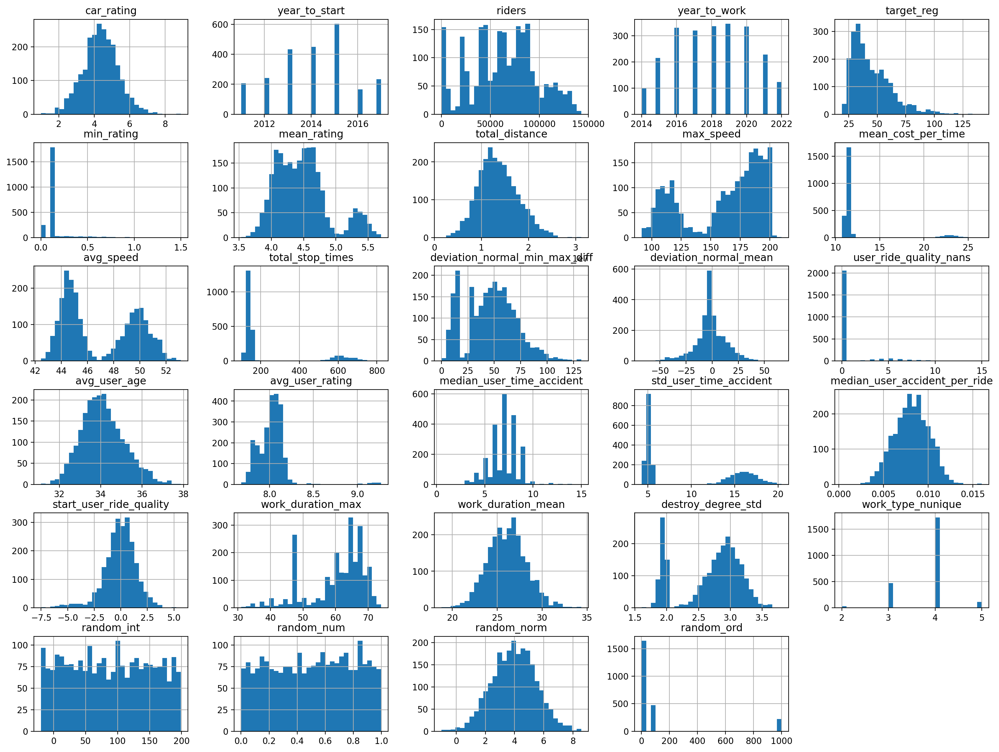

In [44]:
# Добавление рандомных признаков

# Целочисленный признак
car_train_features['random_int'] = np.random.randint(-20, 200, car_train_features.shape[0])

# Признак типа float с равномерным распределением
car_train_features['random_num'] = np.random.random(size = car_train_features.shape[0])

# Признак с нормальным распределением
car_train_features['random_norm'] = np.random.normal(loc = 4, scale = 1.5, size = car_train_features.shape[0])

# Категориальный признак str формата с дисбалансом
car_train_features['random_cat'] = np.random.choice(['A', 'B', 'C', 'D'], p = [0.20, 0.3, 0.45, 0.05], 
                                                    size = car_train_features.shape[0]) 

# Численный категориальный признак
car_train_features['random_ord'] = np.random.choice([1, 10, 100, 1000], p = [0.40, 0.3, 0.2, 0.1], 
                                                    size = car_train_features.shape[0])

car_train_features.hist(figsize = (20, 15), layout = (-1, 5), bins=30);

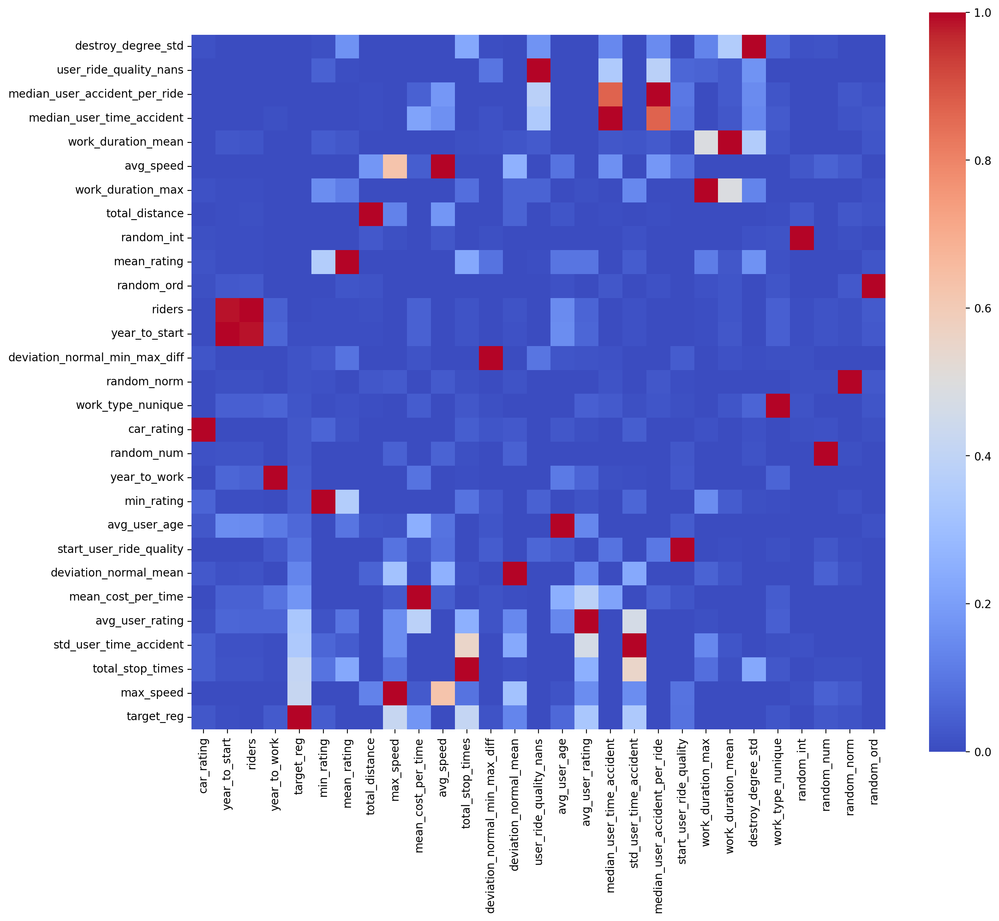

In [45]:
# 1. Линейная корреляция
corrs = car_train_features.corr(numeric_only=True).round(3).sort_values('target_reg')
plt.figure(figsize=(14, 12))
sns.heatmap(corrs, cmap='coolwarm', square=True, vmin = 0)
plt.show()

Сильная положительная корреляция между year_to_start и riders, также наблюдается корреляция между колонками median_user_accident_per_ride и median_user_time_accident. Слабая корреляция с колонкой target_reg у max_speed, total_stop_times, std_user_time_accident, avg_user_rating

In [46]:
#!pip install phik -q

In [47]:
import phik
from phik.report import plot_correlation_matrix
from phik import report

interval columns not set, guessing: ['car_rating', 'year_to_start', 'riders', 'year_to_work', 'target_reg', 'min_rating', 'mean_rating', 'total_distance', 'max_speed', 'mean_cost_per_time', 'avg_speed', 'total_stop_times', 'deviation_normal_min_max_diff', 'deviation_normal_mean', 'user_ride_quality_nans', 'avg_user_age', 'avg_user_rating', 'median_user_time_accident', 'std_user_time_accident', 'median_user_accident_per_ride', 'start_user_ride_quality', 'work_duration_max', 'work_duration_mean', 'destroy_degree_std', 'work_type_nunique', 'random_int', 'random_num', 'random_norm', 'random_ord']


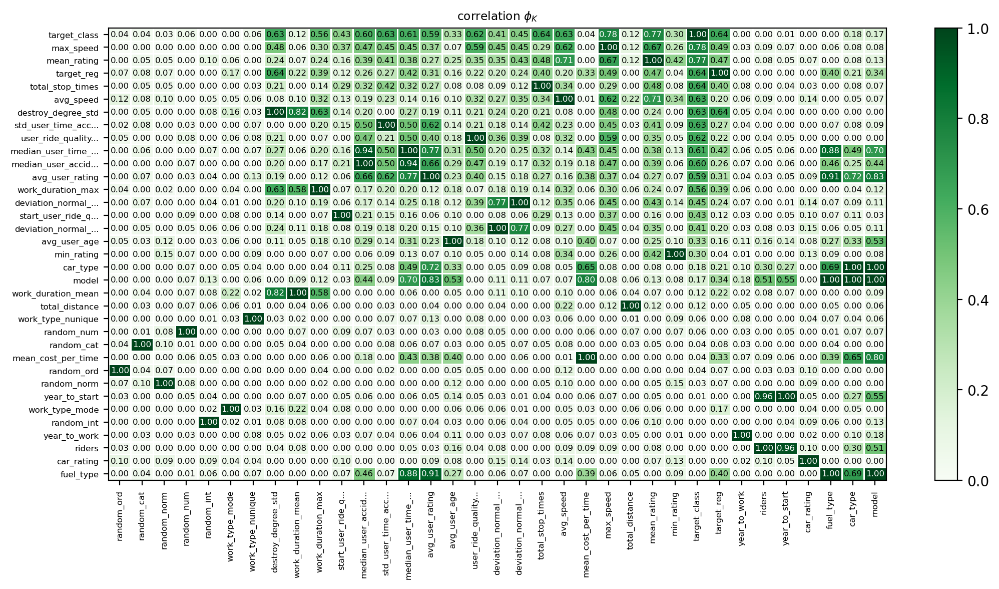

In [48]:
# 2. Phik
phik_overview = car_train_features.phik_matrix().round(2).sort_values('target_class')

plot_correlation_matrix(phik_overview.values, 
                        x_labels=phik_overview.columns, 
                        y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map="Greens", 
                        title=r"correlation $\phi_K$", 
                        fontsize_factor=0.6, figsize=(11, 6))
plt.tight_layout()
plt.show()

Корреляция с target_class наблюдается у max_speed, min_rating, total_stop_times, avg_speed, destroy_degree_std, std_user_time_accident, user_ride_quality_nans, median_user_time_accident, median_user_accident_per_ride, avg_user_rating  
корреляции между признаками: work_duration_mean и destroy_degree_std, median_user_time_accident и median_user_accident_per_ride, fuel_type и median_user_time_accident, fuel_type и avg_user_rating, model и avg_user_rating, model и mean_cost_per_time, year_to_start и riders

interval columns not set, guessing: ['car_rating', 'year_to_start', 'riders', 'year_to_work', 'target_reg', 'min_rating', 'mean_rating', 'total_distance', 'max_speed', 'mean_cost_per_time', 'avg_speed', 'total_stop_times', 'deviation_normal_min_max_diff', 'deviation_normal_mean', 'user_ride_quality_nans', 'avg_user_age', 'avg_user_rating', 'median_user_time_accident', 'std_user_time_accident', 'median_user_accident_per_ride', 'start_user_ride_quality', 'work_duration_max', 'work_duration_mean', 'destroy_degree_std', 'work_type_nunique', 'random_int', 'random_num', 'random_norm', 'random_ord']


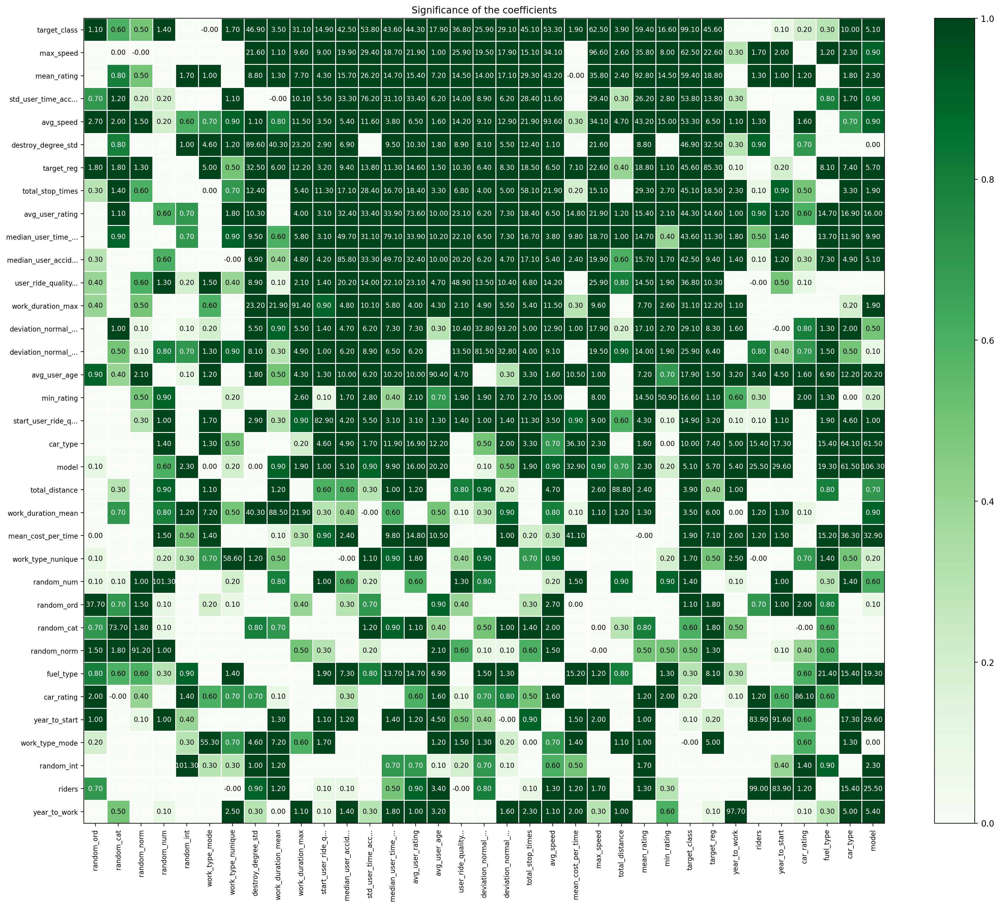

In [49]:
significance_overview = car_train_features.significance_matrix().fillna(0).round(1).sort_values('target_class')

plot_correlation_matrix(significance_overview.values, 
                        x_labels=significance_overview.columns, 
                        y_labels=significance_overview.index, 
                        vmin=0, vmax=1, color_map="Greens",
                        title="Significance of the coefficients", 
                        usetex=False, fontsize_factor=0.8, figsize=(18, 15))
plt.tight_layout()

Значимость коэффициентов для target_class: max_speed, mean_rating, std_user_time_accident, avg_speed, destroy_degree_std, total_stop_times, avg_user_rating, median_user_time_accident, median_user_accident_per_ride, user_ride_quality_nans, work_duration_max, deviation_normal_min_max_diff, deviation_normal_mean, avg_user_age, min_rating, start_user_ride_quality, car_type, model.

In [50]:
# 3. Feature Importance
from catboost import CatBoostRegressor, Pool, CatBoostClassifier
from sklearn.model_selection import train_test_split

In [51]:
# Распределенность классов
car_train_features['target_class'].value_counts(normalize=True)

engine_overheat    0.123663
gear_stick         0.121523
another_bug        0.119384
engine_check       0.115533
break_bug          0.115533
engine_ignition    0.115105
engine_fuel        0.112110
electro_bug        0.106547
wheel_shake        0.070603
Name: target_class, dtype: float64

In [52]:
# Подготовка данных, разделение на train и test
drop_cols = ['target_class', 'target_reg']
cat_cols = ['model', 'car_type', 'fuel_type', 'work_type_mode', 'random_cat']

X = car_train_features.drop(drop_cols, axis=1)
y = car_train_features['target_class'].fillna(0)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [53]:
# Инициализация и обучение модели CatBoostClassifier
model = CatBoostClassifier(random_state=42,
                           cat_features=cat_cols,
                           thread_count=-1)
model.fit(X_train, y_train, 
          eval_set=(X_test, y_test),
          verbose=100, plot=False, 
          early_stopping_rounds=100)

Learning rate set to 0.109335
0:	learn: 1.5990128	test: 1.6098900	best: 1.6098900 (0)	total: 416ms	remaining: 6m 56s
100:	learn: 0.0271525	test: 0.0346609	best: 0.0346609 (100)	total: 23.4s	remaining: 3m 28s
200:	learn: 0.0121388	test: 0.0242266	best: 0.0242266 (200)	total: 47s	remaining: 3m 6s
300:	learn: 0.0078112	test: 0.0215817	best: 0.0215817 (300)	total: 1m 10s	remaining: 2m 43s
400:	learn: 0.0052766	test: 0.0204080	best: 0.0203572 (390)	total: 1m 35s	remaining: 2m 22s
500:	learn: 0.0039286	test: 0.0200637	best: 0.0200637 (500)	total: 1m 59s	remaining: 1m 58s
600:	learn: 0.0032316	test: 0.0201008	best: 0.0199778 (561)	total: 2m 22s	remaining: 1m 34s
Stopped by overfitting detector  (100 iterations wait)

bestTest = 0.01997779226
bestIteration = 561

Shrink model to first 562 iterations.


In [54]:
# Важность признаков CatBoostClassifier
fi = model.get_feature_importance(prettified=True)
fi

,Feature Id,Importances
0,destroy_degree_std,23.449008
1,std_user_time_accident,17.422445
2,max_speed,13.087582
3,avg_speed,12.042494
4,avg_user_rating,8.649307
5,mean_rating,5.386060
6,total_stop_times,5.168435
7,min_rating,4.896046
8,median_user_time_accident,2.746590
9,user_ride_quality_nans,2.171222


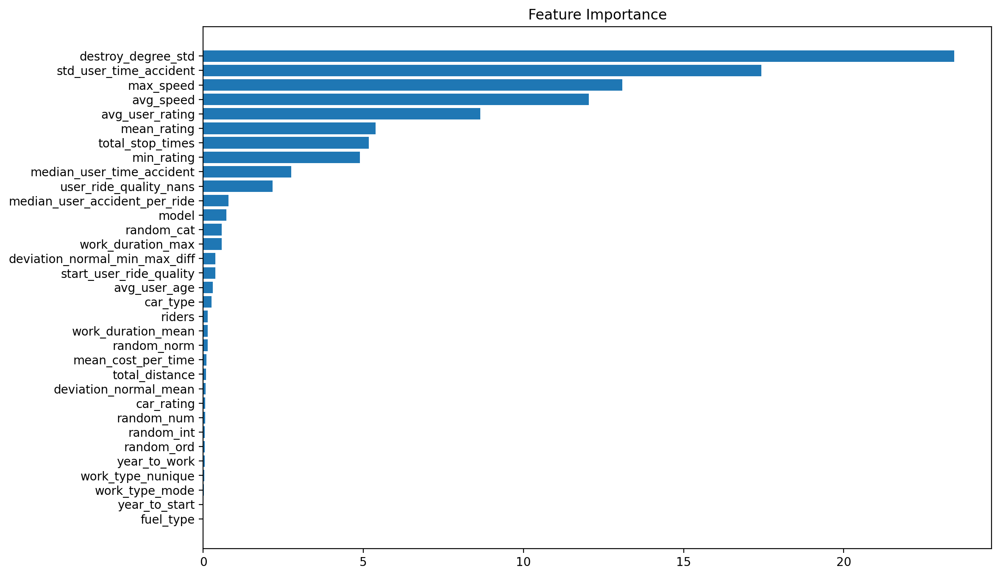

In [55]:
# Визуализация важности признаков CatBoostClassifier
feature_importance = model.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 8))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X.columns)[sorted_idx])
plt.title('Feature Importance')
plt.show()

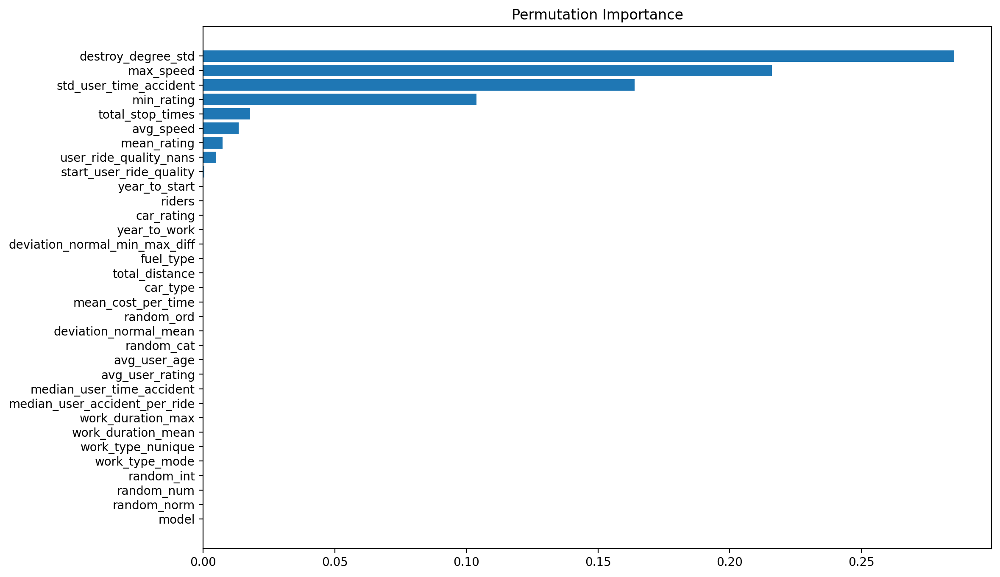

In [56]:
# 4. Permutation Importance
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(model, X_test, y_test, n_repeats=10, random_state=1066)
sorted_idx = perm_importance.importances_mean.argsort()
fig = plt.figure(figsize=(12, 8))
plt.barh(range(len(sorted_idx)), perm_importance.importances_mean[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X.columns)[sorted_idx])
plt.title('Permutation Importance');

In [57]:
#!pip install shap -q

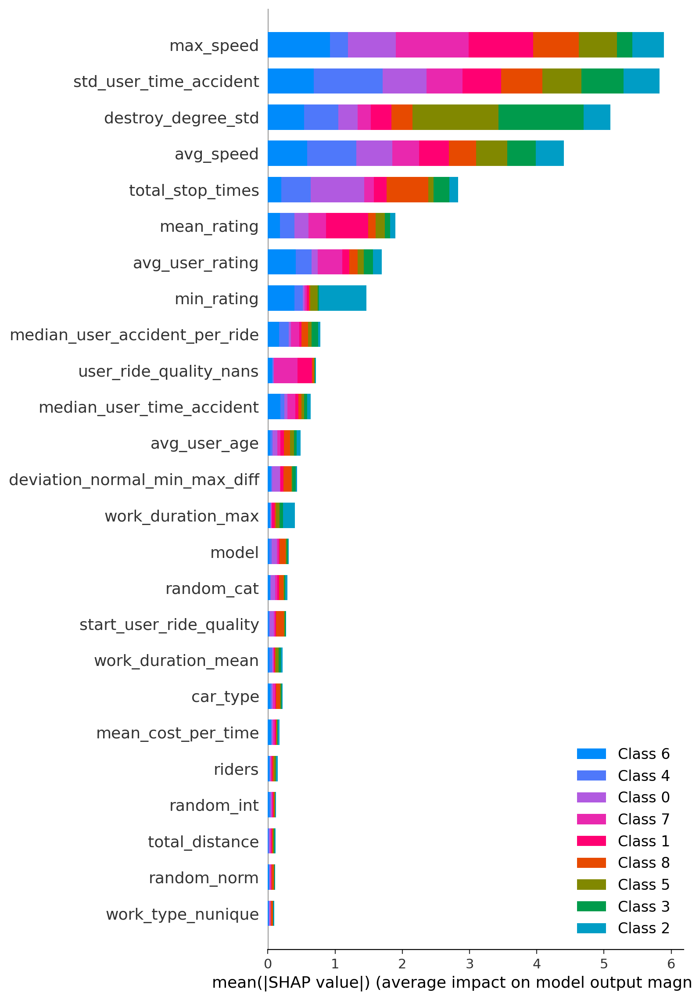

In [58]:
# 5. SHAP values
import shap

explainer = shap.TreeExplainer(model)

val_dataset = Pool(data=X_test, label=y_test, cat_features=cat_cols)
shap_values = explainer.shap_values(val_dataset)
shap.summary_plot(shap_values, X_test, max_display = 25)

In [59]:
# 6. CatBoost Feature Selection
summary = model.select_features(X_train, y_train, 
                      eval_set=(X_test, y_test),
                      features_for_select='0-32',
                      num_features_to_select=15,
                      steps=3,
                      train_final_model=False,
                      logging_level='Silent')

In [60]:
# Список отобранных признаков (не отранжирован по важности). В него вошел рандомный признак random_norm
print(summary['selected_features_names'])
print()

# Список исключенных признаков
print(summary['eliminated_features_names'])
print()

# Лучшее значение loss
print(f"Best loss: {summary['loss_graph']['loss_values'][-1]}")

['car_rating', 'min_rating', 'mean_rating', 'max_speed', 'avg_speed', 'total_stop_times', 'deviation_normal_mean', 'user_ride_quality_nans', 'avg_user_rating', 'median_user_time_accident', 'std_user_time_accident', 'start_user_ride_quality', 'destroy_degree_std', 'work_type_mode', 'random_norm']

['deviation_normal_min_max_diff', 'work_duration_max', 'work_type_nunique', 'random_cat', 'random_ord', 'work_duration_mean', 'riders', 'random_num', 'mean_cost_per_time', 'avg_user_age', 'year_to_start', 'model', 'year_to_work', 'total_distance', 'median_user_accident_per_ride', 'car_type', 'fuel_type', 'random_int']

Best loss: 0.01630728833432797


In [61]:
# Полный отчет работы алгоритма
summary

{'selected_features': [3,
  7,
  8,
  10,
  12,
  13,
  15,
  16,
  18,
  19,
  20,
  22,
  25,
  27,
  30],
 'eliminated_features_names': ['deviation_normal_min_max_diff',
  'work_duration_max',
  'work_type_nunique',
  'random_cat',
  'random_ord',
  'work_duration_mean',
  'riders',
  'random_num',
  'mean_cost_per_time',
  'avg_user_age',
  'year_to_start',
  'model',
  'year_to_work',
  'total_distance',
  'median_user_accident_per_ride',
  'car_type',
  'fuel_type',
  'random_int'],
 'loss_graph': {'main_indices': [0, 8, 13],
  'removed_features_count': [0,
   1,
   2,
   3,
   4,
   5,
   6,
   7,
   8,
   9,
   10,
   11,
   12,
   13,
   14,
   15,
   16,
   17,
   18],
  'loss_values': [0.01919271299141274,
   0.018638596995211604,
   0.018425308959671333,
   0.018320953753446428,
   0.018245845609011505,
   0.018204113658288106,
   0.018171060022120503,
   0.018146829814977658,
   0.018130963759125034,
   0.017517855291226257,
   0.016977932390567052,
   0.016845450306881903

Объединим полученные данные с 6 разных методов и выделим топ-15 признаков для дальнейшей работы. На картинке в столбцах с C по F признаки в порядке убывания значимости 
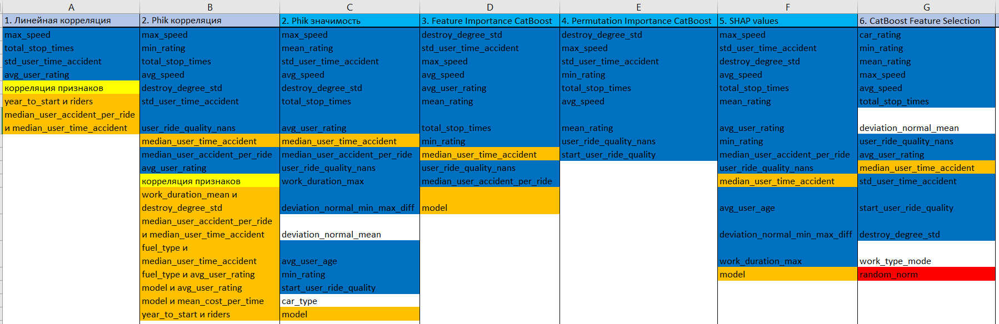
- destroy_degree_std
- max_speed
- std_user_time_accident
- avg_speed
- total_stop_times
- mean_rating
- avg_user_rating
- min_rating
- median_user_accident_per_ride
- user_ride_quality_nans  
---
- start_user_ride_quality
- work_duration_max
- deviation_normal_min_max_diff
- avg_user_age
- car_rating

In [41]:
# Топ-10 самых встречаемых признаков
important_features = ['destroy_degree_std', 'max_speed', 'std_user_time_accident', 'avg_speed', 'total_stop_times', 
                      'mean_rating', 'avg_user_rating', 'min_rating', 'median_user_accident_per_ride', 'user_ride_quality_nans']

In [42]:
# Топ-15 самых встречаемых признаков
important_features_15 = important_features + ['start_user_ride_quality', 'work_duration_max', 'deviation_normal_min_max_diff',
                                             'avg_user_age', 'car_rating']

In [64]:
# Смотрим на изменение loss (было 0.01997779226 при первом применении) при топ-10
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

model_10 = CatBoostClassifier(random_state=42,
                           thread_count=-1)


model_10.fit(X_train[important_features], y_train, 
          eval_set=(X_test[important_features], y_test),
          verbose=100, plot=False, 
          early_stopping_rounds=100)

Learning rate set to 0.109335
0:	learn: 1.6516452	test: 1.6510755	best: 1.6510755 (0)	total: 31.8ms	remaining: 31.8s
100:	learn: 0.0209072	test: 0.0262788	best: 0.0262788 (100)	total: 2.6s	remaining: 23.1s
200:	learn: 0.0113243	test: 0.0208351	best: 0.0208351 (200)	total: 5.01s	remaining: 19.9s
300:	learn: 0.0070940	test: 0.0192241	best: 0.0191967 (289)	total: 7.43s	remaining: 17.3s
400:	learn: 0.0052268	test: 0.0187891	best: 0.0187891 (400)	total: 9.82s	remaining: 14.7s
500:	learn: 0.0040463	test: 0.0182458	best: 0.0181969 (499)	total: 12.2s	remaining: 12.2s
600:	learn: 0.0032638	test: 0.0181989	best: 0.0181462 (569)	total: 14.7s	remaining: 9.76s
Stopped by overfitting detector  (100 iterations wait)

bestTest = 0.01814621296
bestIteration = 569

Shrink model to first 570 iterations.


In [73]:
# Смотрим на изменение loss (было 0.01997779226 при первом применении) при топ-15
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

model_15 = CatBoostClassifier(random_state=42,
                           thread_count=-1)


model_15.fit(X_train[important_features_15], y_train, 
          eval_set=(X_test[important_features_15], y_test),
          verbose=100, plot=False, 
          early_stopping_rounds=100)

Learning rate set to 0.109335
0:	learn: 1.5460743	test: 1.5550485	best: 1.5550485 (0)	total: 70.8ms	remaining: 1m 10s
100:	learn: 0.0183162	test: 0.0257031	best: 0.0257031 (100)	total: 3.43s	remaining: 30.5s
200:	learn: 0.0087355	test: 0.0204935	best: 0.0204935 (200)	total: 7.38s	remaining: 29.3s
300:	learn: 0.0055905	test: 0.0189872	best: 0.0189506 (295)	total: 11.2s	remaining: 26s
400:	learn: 0.0039005	test: 0.0178950	best: 0.0178851 (396)	total: 15s	remaining: 22.4s
500:	learn: 0.0029686	test: 0.0179605	best: 0.0178585 (403)	total: 18.2s	remaining: 18.1s
Stopped by overfitting detector  (100 iterations wait)

bestTest = 0.01785852719
bestIteration = 403

Shrink model to first 404 iterations.


CatBoost, loss  
первое применение 0.01997779226  
топ-10 признаков 0.01814621296  
топ-15 признаков 0.01785852719  
наблюдается небольшое уменьшение loss

# Домашнее задание 2. Прогноз времени и вида поломки машин. Настройка ML-модели

<div class="alert alert-info">

**Цель блока** — составить тренировочную и валидационную выборки, произвести обучение модели `CatBoostClassifier` на тренировочной части и оценить качество на валидационной.

##Обучение первой модели (5 баллов)

1.   Новый пункт
2.   Новый пункт



1. Классифицируйте признаки на типы (категориальные, числовые, таргеты).

2. Выделите в `X` только признаки, а в `y` таргет (для задачи классификации).

3. Сделайте разделение данных на *обучающую* и *валидационную* выборки (не забывайте про воспроизводимость результатов).

4. Создайте и обучите `CatBoostClassifier` модель (настраивать гиперпараметры сейчас не обязательно).

5. Проведите оценку вашей модели, используя метрику `accuracy`.


<h4> Критерии оценивания </h4>
    
- По 1 баллу за каждый корректно выполненный пункт.

</div>

In [40]:
from catboost import CatBoostClassifier, Pool
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

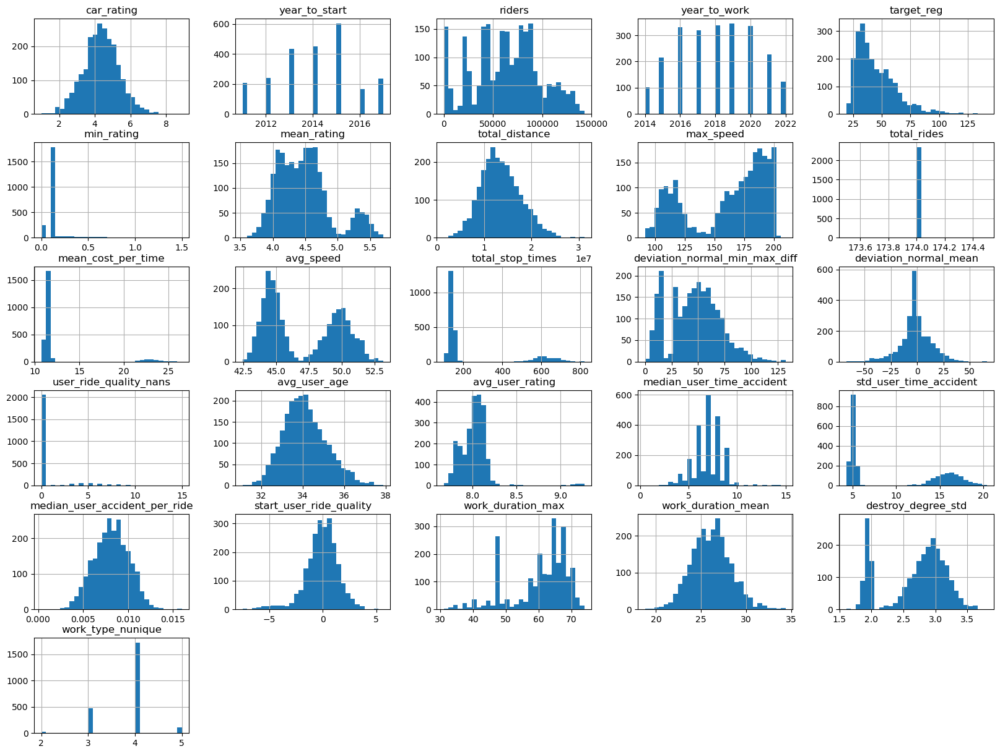

In [41]:
# Распределение признаков
car_train_features.hist(figsize = (20, 15), layout = (-1, 5), bins=30);

In [42]:
# Информация о датафрейме
car_train_features.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2337 entries, 0 to 2336
Data columns (total 32 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   car_id                         2337 non-null   object 
 1   model                          2337 non-null   object 
 2   car_type                       2337 non-null   object 
 3   fuel_type                      2337 non-null   object 
 4   car_rating                     2337 non-null   float64
 5   year_to_start                  2337 non-null   int64  
 6   riders                         2337 non-null   int64  
 7   year_to_work                   2337 non-null   int64  
 8   target_reg                     2337 non-null   float64
 9   target_class                   2337 non-null   object 
 10  min_rating                     2337 non-null   float64
 11  mean_rating                    2337 non-null   float64
 12  total_distance                 2337 non-null   f

In [47]:
# Классификация признаков на типы (категориальные, числовые, таргеты). Из предыдущего задания были выбраны топ-15 признаков 
# для обучения модели, из них все 15 - это числовые признаки
features2drop = ['car_id', 'total_rides', 'target_class', 'target_reg'] # то, что надо выбросить

targets = ['target_class'] # таргеты

#cat_features = [...] # категориальные признаки

num_features = important_features_15 # числовые признаки

#print('Категориальные признаки:', len(cat_features), cat_features)
print('Числовые признаки:', len(num_features), num_features)
print('Целевые переменные', targets)

Числовые признаки: 15 ['destroy_degree_std', 'max_speed', 'std_user_time_accident', 'avg_speed', 'total_stop_times', 'mean_rating', 'avg_user_rating', 'min_rating', 'median_user_accident_per_ride', 'user_ride_quality_nans', 'start_user_ride_quality', 'work_duration_max', 'deviation_normal_min_max_diff', 'avg_user_age', 'car_rating']
Целевые переменные ['target_class']


In [48]:
# Подготовка данных. Выделение X и y, разделение данных на обучающую и валидационную выборки с random state
X = car_train_features[num_features]
y = car_train_features['target_class']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [49]:
# Обучение с параметрами по умолчанию
clf1 = CatBoostClassifier(thread_count=-1,
                         random_seed=42
                         #cat_features=cat_features
                        )

clf1.fit(
    X_train,
    y_train,
    eval_set=(X_test, y_test),
    verbose=200,
    use_best_model=True,
    plot=False,
    early_stopping_rounds=100,
)

Learning rate set to 0.109335
0:	learn: 1.5324187	test: 1.5433586	best: 1.5433586 (0)	total: 116ms	remaining: 1m 55s
200:	learn: 0.0090926	test: 0.0364501	best: 0.0364501 (200)	total: 7.04s	remaining: 28s
400:	learn: 0.0040427	test: 0.0343118	best: 0.0342647 (389)	total: 13.8s	remaining: 20.6s
600:	learn: 0.0026462	test: 0.0341856	best: 0.0337566 (541)	total: 22.3s	remaining: 14.8s
Stopped by overfitting detector  (100 iterations wait)

bestTest = 0.03375656956
bestIteration = 541

Shrink model to first 542 iterations.


In [52]:
from sklearn.metrics import classification_report
# Accuracy=0.99
print(classification_report(y_true = y_test, y_pred = clf1.predict(X_test), target_names=clf1.classes_))

                 precision    recall  f1-score   support

    another_bug       0.97      0.98      0.97        58
      break_bug       1.00      1.00      1.00        56
    electro_bug       1.00      1.00      1.00        51
   engine_check       1.00      1.00      1.00        49
    engine_fuel       1.00      1.00      1.00        58
engine_ignition       0.98      1.00      0.99        58
engine_overheat       1.00      0.98      0.99        48
     gear_stick       1.00      1.00      1.00        51
    wheel_shake       0.97      0.95      0.96        39

       accuracy                           0.99       468
      macro avg       0.99      0.99      0.99       468
   weighted avg       0.99      0.99      0.99       468



In [53]:
# Кол-во деревьев поставим 100
clf2 = CatBoostClassifier(iterations=100,
                         thread_count=-1,
                         random_seed=42,
                         #cat_features=cat_features
                        )

clf2.fit(
    X_train,
    y_train,
    eval_set=(X_test, y_test),
    verbose=10,
    use_best_model=True,
    early_stopping_rounds=50,
)

Learning rate set to 0.263488
0:	learn: 0.8055756	test: 0.8287787	best: 0.8287787 (0)	total: 58.3ms	remaining: 5.77s
10:	learn: 0.0915589	test: 0.1125062	best: 0.1125062 (10)	total: 399ms	remaining: 3.23s
20:	learn: 0.0453812	test: 0.0694507	best: 0.0694507 (20)	total: 726ms	remaining: 2.73s
30:	learn: 0.0280834	test: 0.0535781	best: 0.0535781 (30)	total: 1.06s	remaining: 2.37s
40:	learn: 0.0205092	test: 0.0476163	best: 0.0476138 (39)	total: 1.4s	remaining: 2.02s
50:	learn: 0.0168086	test: 0.0459845	best: 0.0459845 (50)	total: 1.73s	remaining: 1.66s
60:	learn: 0.0145636	test: 0.0443489	best: 0.0443489 (60)	total: 2.05s	remaining: 1.31s
70:	learn: 0.0117991	test: 0.0426639	best: 0.0426439 (69)	total: 2.38s	remaining: 972ms
80:	learn: 0.0099225	test: 0.0414325	best: 0.0414325 (80)	total: 2.7s	remaining: 634ms
90:	learn: 0.0085595	test: 0.0412866	best: 0.0412473 (82)	total: 3.03s	remaining: 300ms
99:	learn: 0.0076799	test: 0.0401164	best: 0.0401164 (99)	total: 3.35s	remaining: 0us

bestTe

In [54]:
# Accuracy=0.99
print(classification_report(y_true = y_test, y_pred = clf2.predict(X_test), target_names=clf2.classes_))

                 precision    recall  f1-score   support

    another_bug       0.97      0.98      0.97        58
      break_bug       1.00      1.00      1.00        56
    electro_bug       1.00      1.00      1.00        51
   engine_check       1.00      1.00      1.00        49
    engine_fuel       1.00      1.00      1.00        58
engine_ignition       0.98      1.00      0.99        58
engine_overheat       1.00      0.98      0.99        48
     gear_stick       1.00      1.00      1.00        51
    wheel_shake       0.97      0.95      0.96        39

       accuracy                           0.99       468
      macro avg       0.99      0.99      0.99       468
   weighted avg       0.99      0.99      0.99       468



In [55]:
from sklearn.model_selection import KFold  # k-фолдная валидация

In [56]:
# Обучение по фолдам
n_splits = 3  # Число фолдов.
clfs = [] # Сохранение моделей
scores = [] # Скоры валидационных фолдов

# параметры валидации, обучение будет идти на n_splits фолдах
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
for train_index, test_index in kf.split(X):

    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Специальный класс для ускорения обучения 
    train_dataset = Pool(data=X_train, label=y_train)#, cat_features=cat_features)
    eval_dataset = Pool(data=X_test, label=y_test)#, cat_features=cat_features)

    clf = CatBoostClassifier(
        depth=4,
        iterations=3500,
        learning_rate=0.06,
        loss_function='MultiClass',  # MultiLogloss
        #eval_metric = 'Accuracy',  #F1:macro / AUC:hints=skip_train~false
        custom_metric=['Accuracy'],  # 'AUC / Accuracy,
        
        # Главная фишка катбуста - работа с категориальными признаками
        #cat_features=cat_features,
        # ignored_features = ignored_features,
        
        # Регуляризация и ускорение
        colsample_bylevel=0.098,
        subsample=0.95,
        l2_leaf_reg=9,
        min_data_in_leaf=243,
        max_bin=187,
        random_strength=1,
        
        # Параметры ускорения
        task_type='CPU',    
        thread_count=-1,
        bootstrap_type='Bernoulli', 
        
        # Важное!
        random_seed=42,
        auto_class_weights='SqrtBalanced',
        early_stopping_rounds=25)

    clfs.append(clf)

    clf.fit(
        train_dataset,
        eval_set=eval_dataset,
        verbose=500,
        use_best_model=True,
        plot=False)

    scores.append(np.mean([v for k, v in clf.best_score_['validation'].items() if 'Accuracy' in k], dtype='float16'))
    # scores.append(clf.best_score_['validation']['MultiClass'])
    # clf.save_model("../tmp_data/cool_catboost_model_{}_deep".format(n))

assert len(clfs) == n_splits
print()
print('mean Accuracy score --------->', np.mean(scores, dtype='float16') - np.std(scores, dtype='float16'))

0:	learn: 2.0210457	test: 2.0273035	best: 2.0273035 (0)	total: 24ms	remaining: 1m 24s
500:	learn: 0.0219108	test: 0.0350582	best: 0.0350582 (500)	total: 2.23s	remaining: 13.4s
1000:	learn: 0.0119326	test: 0.0270029	best: 0.0270029 (1000)	total: 4.52s	remaining: 11.3s
1500:	learn: 0.0081011	test: 0.0242941	best: 0.0242521 (1494)	total: 6.92s	remaining: 9.21s
Stopped by overfitting detector  (25 iterations wait)

bestTest = 0.02331944015
bestIteration = 1851

Shrink model to first 1852 iterations.
0:	learn: 2.0224905	test: 2.0196313	best: 2.0196313 (0)	total: 7.24ms	remaining: 25.3s
500:	learn: 0.0243348	test: 0.0296898	best: 0.0296898 (500)	total: 2.6s	remaining: 15.6s
1000:	learn: 0.0130397	test: 0.0210998	best: 0.0210839 (999)	total: 5.64s	remaining: 14.1s
1500:	learn: 0.0087574	test: 0.0183068	best: 0.0183068 (1500)	total: 7.98s	remaining: 10.6s
2000:	learn: 0.0064141	test: 0.0168597	best: 0.0168597 (2000)	total: 10.2s	remaining: 7.65s
2500:	learn: 0.0050892	test: 0.0160760	best: 0.0

In [57]:
clfs[-1].best_score_['validation']

{'Accuracy:use_weights=true': 0.9975756613607709,
 'Accuracy:use_weights=false': 0.9974326059050064,
 'MultiClass': 0.02117285570054957}

In [58]:
# Classification report для последней модели по обучению по фолдам. Accuracy=0.99
y_pred = clf.predict(X_test)
print(classification_report(y_true = y_test,
                            y_pred = y_pred,
                            target_names=clf.classes_))

                 precision    recall  f1-score   support

    another_bug       1.00      0.95      0.97        79
      break_bug       1.00      1.00      1.00        86
    electro_bug       1.00      1.00      1.00        93
   engine_check       1.00      1.00      1.00        86
    engine_fuel       1.00      1.00      1.00        95
engine_ignition       1.00      1.00      1.00        92
engine_overheat       1.00      1.00      1.00       100
     gear_stick       1.00      1.00      1.00        95
    wheel_shake       0.93      1.00      0.96        53

       accuracy                           0.99       779
      macro avg       0.99      0.99      0.99       779
   weighted avg       1.00      0.99      0.99       779



Среднее Accuracy за вычетом стандартного отклонения при обучении по фолдам: 0.994

# Дополнительное задание. Визуализация прогнозов, ошибок модели и важности признаков

<div class="alert alert-info">

**Цель блока** — визуализировать результаты прогнозирования, ошибки модели и важность признаков для лучшего понимания и анализа модели.

## Визуализация (5 баллов)

   
1. Визуализируйте важность признаков встроенным методом в `CatBoost`  (помните, что не стоит сильно доверять этому рейтингу важности, т. к. для сильно скоррелированных признаков важность делится пополам — оба признака могут улететь вниз).

2. Постройте `waterfall_plot` из библиотеки `SHAP` (подробнее во втором ноутбуке из полезных ссылок ниже).
    
3. Постройте `classification_report` из библиотеки `scikit-learn`.

4. Постройте и визуализируйте матрицу смежности (`confusion_matrix`), посмотрите, в каких классах модель больше всего ошибается.
    
5. Для каждого графика/примененного метода проинтерпретируйте результаты и сделайте выводы.


<h4> Критерии оценивания </h4>
    
- По 1 баллу за каждый корректно выполненный пункт.
    
</div>

<div class="alert alert-success">

Визуализация может помочь даже после того, как мы **уже обучили** какую-нибудь модель. Например:

- Понять, что мешает модели или чего не хватает, чтобы не допускать ошибки.
- Сделать выводы, как можно улучшить точность в последующих экспериментах.
- Визуализировать ошибки модели.
- Отсеять лишние признаки.
- Найти идеи для новых признаков.
- Все зависит от типа ваших данных.

<h3> Полезные источники </h3>
    
- Занятие про визуализацию и Seaborn.
- Занятие про продвинутую визуализацию и анализ ошибок модели.

</div>    

In [59]:
# 1. Визуализация важности признаков CatBoost
def plot_importance(df, best_model, height = 0.2, top_n=50):

    fi = pd.DataFrame(index=df.columns, columns=[])
    for i, m in enumerate(best_model):
        fi[f'm_{i}'] = m.get_feature_importance()

    fi = fi.stack().reset_index().iloc[:, [0, 2]]  # .to_frame()
    fi.columns = ['feature', 'importance']

    cols_ord = list(fi.groupby('feature')['importance'].mean().sort_values(ascending=False).index)
    
    print('Всего признаков {} Усреднее по {} моделям: '.format(len(cols_ord), len(best_model)))
    cols_ord = cols_ord[:top_n]

    fi = fi[fi['feature'].isin(cols_ord)]

    plt.figure(figsize=(10, len(cols_ord) * height))
    b = sns.boxplot(data=fi, y='feature', x='importance', orient='h', order=cols_ord)
    b.set_title('Feature importance CatBoost')

    print('На график нанесено топ-{} признаков'.format(top_n))
    return (
        fi.groupby(by=['feature'], as_index=False)['importance']
        .mean()
        .sort_values(by='importance', ascending=False))

Всего признаков 15 Усреднее по 3 моделям: 
На график нанесено топ-15 признаков


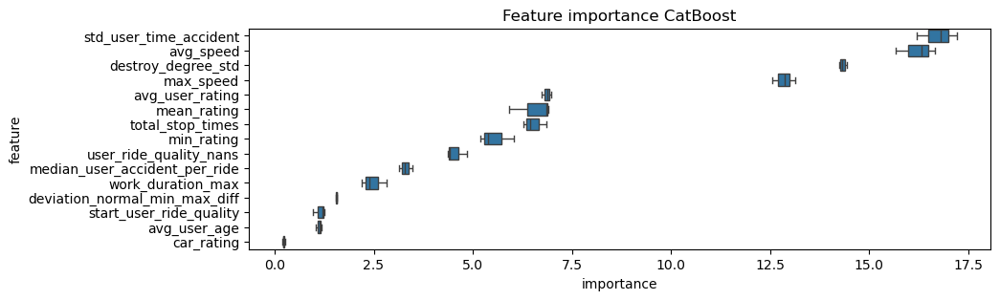

In [60]:
df_feats_imp = plot_importance(
    car_train_features[num_features],
    best_model = clfs,
    height = 0.20,
    top_n=15,
)

In [61]:
df_feats_imp

,feature,importance
11,std_user_time_accident,16.740167
0,avg_speed,16.219046
4,destroy_degree_std,14.336557
6,max_speed,12.853257
2,avg_user_rating,6.864887
7,mean_rating,6.557022
12,total_stop_times,6.530005
9,min_rating,5.539050
13,user_ride_quality_nans,4.540240
8,median_user_accident_per_ride,3.300962


Топ-10 признаков
- destroy_degree_std
- max_speed
- std_user_time_accident
- avg_speed
- total_stop_times
- mean_rating
- avg_user_rating
- min_rating
- median_user_accident_per_ride
- user_ride_quality_nans  
---
Топ-5 дополнительных признаков
- start_user_ride_quality
- work_duration_max
- deviation_normal_min_max_diff
- avg_user_age
- car_rating  

Смотря на график видно, что выбранные топ-10 признаков в предыдущем задании имеют значение больше, чем 5 признаков, которые были выбраны дополнительно. Выделяются по важности 4 признака из всех выбранных:
- std_user_time_accident
- avg_speed
- destroy_degree_std
- max_speed  
Но посмотрим на другие визуализации, чтобы оценить работу модели.

In [62]:
import shap

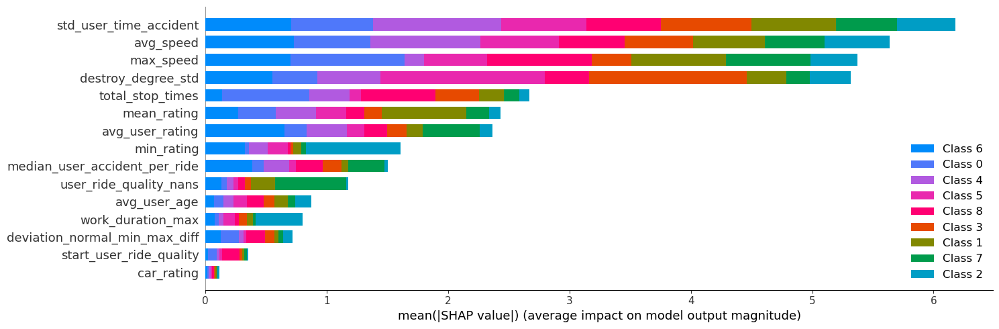

In [63]:
# Библиотека SHAP
# Рассмотрим последнюю модель при использовании K-fold, сначала построим важность признаков в зависимости от класса
explainer = shap.TreeExplainer(clfs[-1])

val_dataset = Pool(data=X_test, label=y_test)
shap_values = explainer.shap_values(val_dataset)

shap.summary_plot(shap_values, X_test, max_display = 25, plot_size = (15, 5))

В данном случае, используя библиотеку Shap, влияние признаков на классы немного в другом порядке, но топ-10 признаков по прежнему выше по важности чем топ-5 дополнительных. 
- std_user_time_accident
- avg_speed
- destroy_degree_std
- max_speed  
4 признака также выделяются по важности по сравнению с другими. Далее сначала посмотрим на ошибки, построив classification report и confusion matrix, а далее построим waterfall, чтобы оценить вклад признаков в определение каждого класса для конкретных наблюдений с ошибками.

In [64]:
# 3. Сlassification_report из библиотеки scikit-learn
rep = pd.DataFrame(classification_report(y_true = y_test,
                            y_pred = y_pred,
                            target_names=clf.classes_,
                            output_dict=True)).T
rep['support'] = rep.support.apply(int)
rep.style.background_gradient(cmap='viridis', subset=pd.IndexSlice['another_bug':'wheel_shake', :'f1-score'])

,precision,recall,f1-score,support
another_bug,1.000000,0.949367,0.974026,79
break_bug,1.000000,1.000000,1.000000,86
electro_bug,1.000000,1.000000,1.000000,93
engine_check,1.000000,1.000000,1.000000,86
engine_fuel,1.000000,1.000000,1.000000,95
engine_ignition,1.000000,1.000000,1.000000,92
engine_overheat,1.000000,1.000000,1.000000,100
gear_stick,1.000000,1.000000,1.000000,95
wheel_shake,0.929825,1.000000,0.963636,53
accuracy,0.994865,0.994865,0.994865,0


Из classification report видно, что accuracy 0.99, метрика высокая, также как и precision, recall, f1-score. Есть ошибки на пересечении классов another_bug и wheel_shake. Посмотрим на кол-во ошибок по каждому классу, используя confusion matrix.

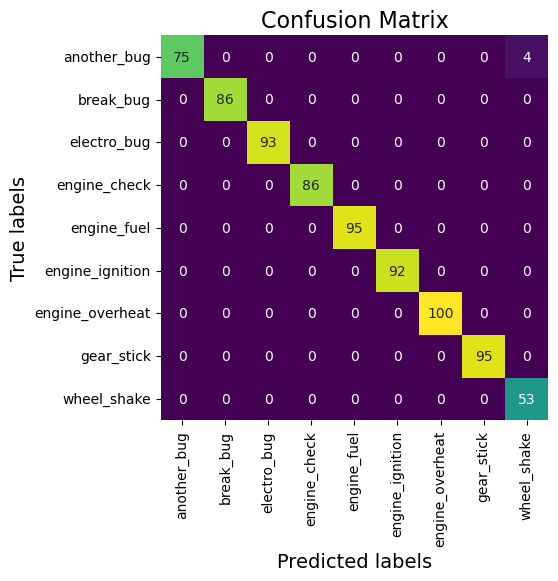

In [65]:
# 4. Сonfusion_matrix

from sklearn.metrics import confusion_matrix
cf = confusion_matrix(y_test, y_pred)

# Названия классов
class_names = clf.classes_

# Визуализация с Seaborn
plt.figure(figsize=(5, 5))
sns.heatmap(cf, annot=True, fmt='d', cmap='viridis', xticklabels=class_names, yticklabels=class_names, cbar=False)

# Добавление подписей к осям и заголовка
plt.ylabel('True labels', fontsize=14)
plt.xlabel('Predicted labels', fontsize=14)
plt.title('Confusion Matrix', fontsize=16)

# Отображение графика
plt.show()

Также как и в classification report видно, что есть ошибки на пересечении классов another_bug и wheel_shake. 4 из 79 наблюдений относящиеся к another_bug, были отнесены моделью как wheel_shake. Посмотрим под какими строками были эти наблюдения и более детально на waterfall определим какие признаки повлияли на данные решения.

In [66]:
# Номера строк ошибочных предсказаний
mismatches = y_test.reset_index(drop=True).index[y_test.reset_index(drop=True) != y_pred.flatten()].tolist()
mismatches

[49, 274, 293, 618]

In [67]:
y_test.reset_index(drop=True)[618]

'another_bug'

In [68]:
y_pred[618]

array(['wheel_shake'], dtype=object)

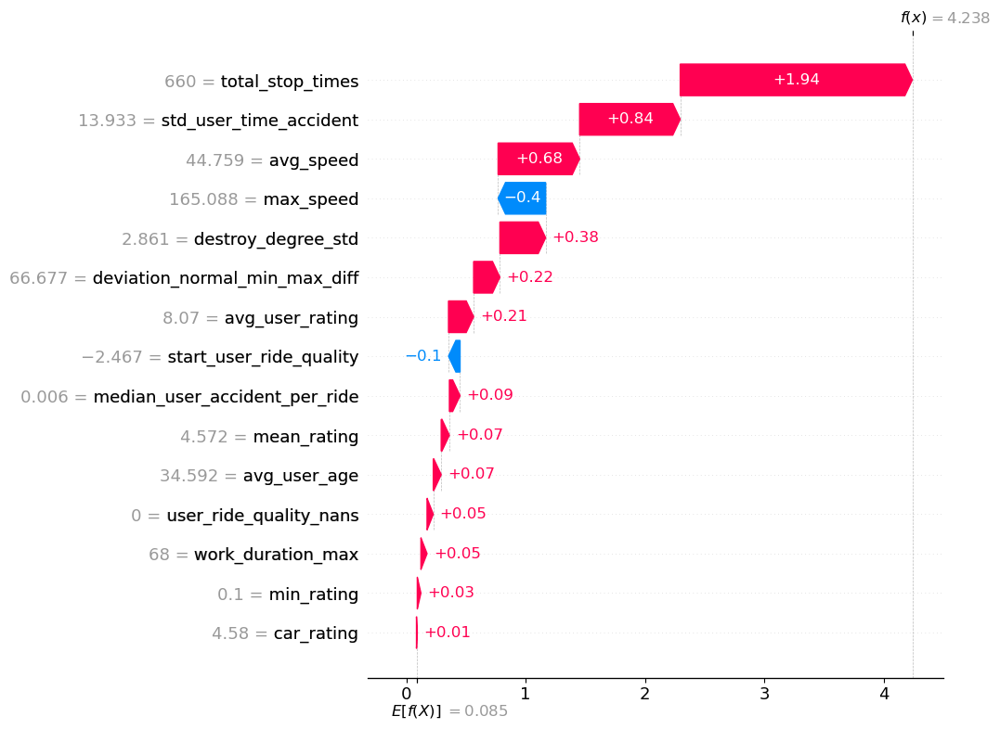

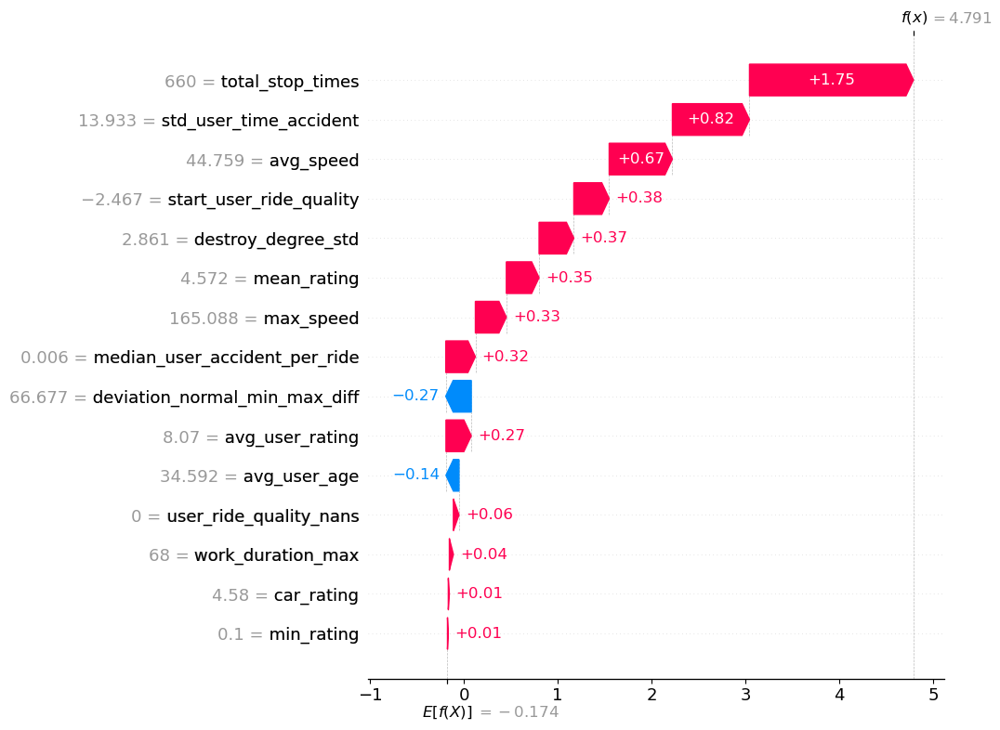

In [69]:
# 2. Waterfall_plot из библиотеки SHAP
# waterfall_plot показывает численное влияние каждого признака по классам для конкретного наблюдения
# another_bug - 0 класс, wheel_shake - 8 класс.
s_values = explainer(X_test)
shap.waterfall_plot(s_values[49][:, 0], max_display=20)
shap.waterfall_plot(s_values[49][:, 8], max_display=20)

Базовое значение $E[f(X)]$ — это среднее предсказание модели для всего набора данных. Это точка отсчета, с которой начинается анализ вклада каждого признака. «Шаги» водопада показывают вклад каждого признака в изменение предсказания от базового значения к конечному. Розовые блоки означают положительный вклад (увеличение предсказания), а голубые блоки соответственно отрицательный вклад (уменьшение предсказания). $f(x)$ - итоговое предсказание модели для данного примера после учета всех признаков.  
Видно, что класс 8 с небольшим перевесом преобладает над классом 0. Для класса 0 "вниз" потянул признак max_speed.  
Самый значительный положительный вклад оказывает признак total_stop_times, далее по важности идут std_user_time_accident и avg_speed.

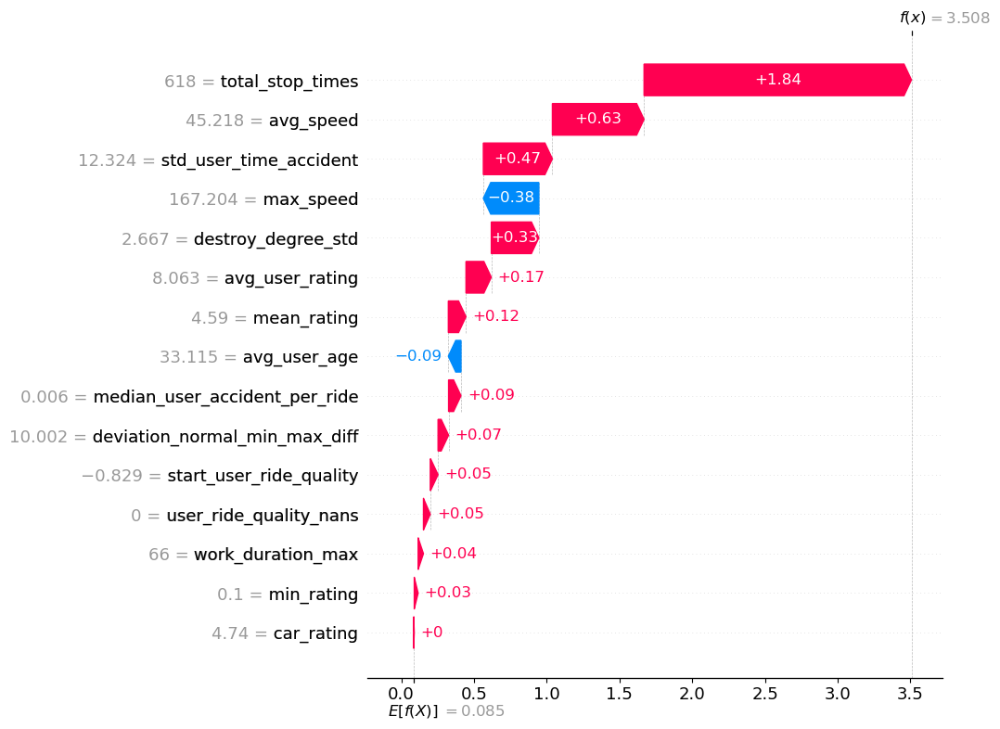

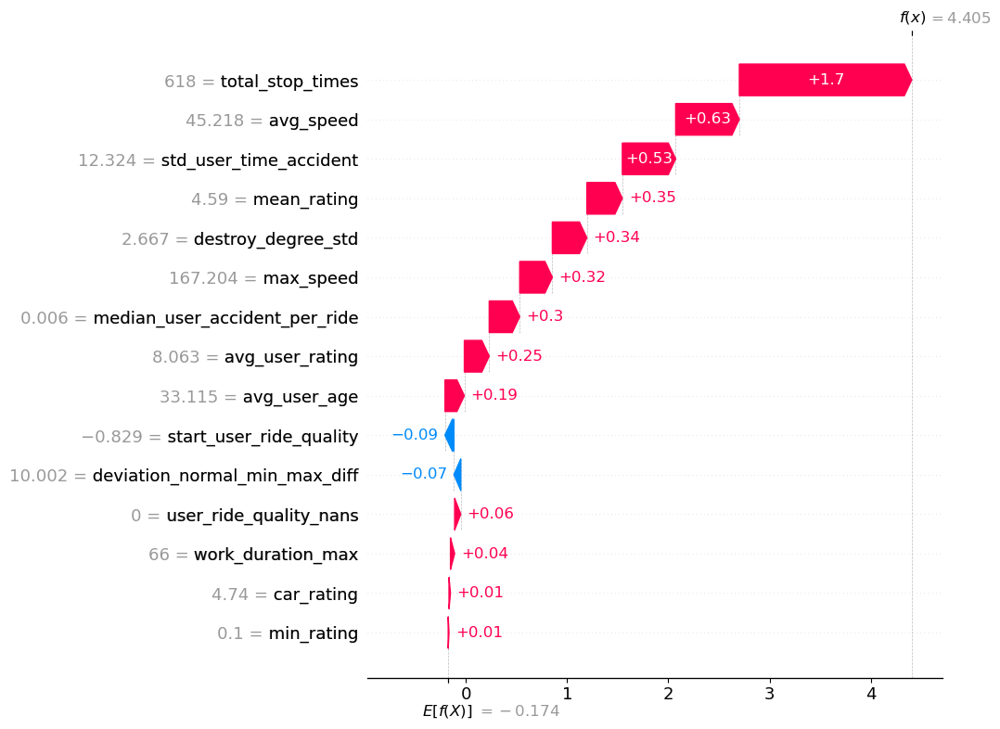

In [70]:
shap.waterfall_plot(s_values[274][:, 0], max_display=20)
shap.waterfall_plot(s_values[274][:, 8], max_display=20)

Аналогичная ситуация обстоит и с наблюдением в строке 274, перевес у класса 8, и для класса 0 "вниз" потянул также max_speed

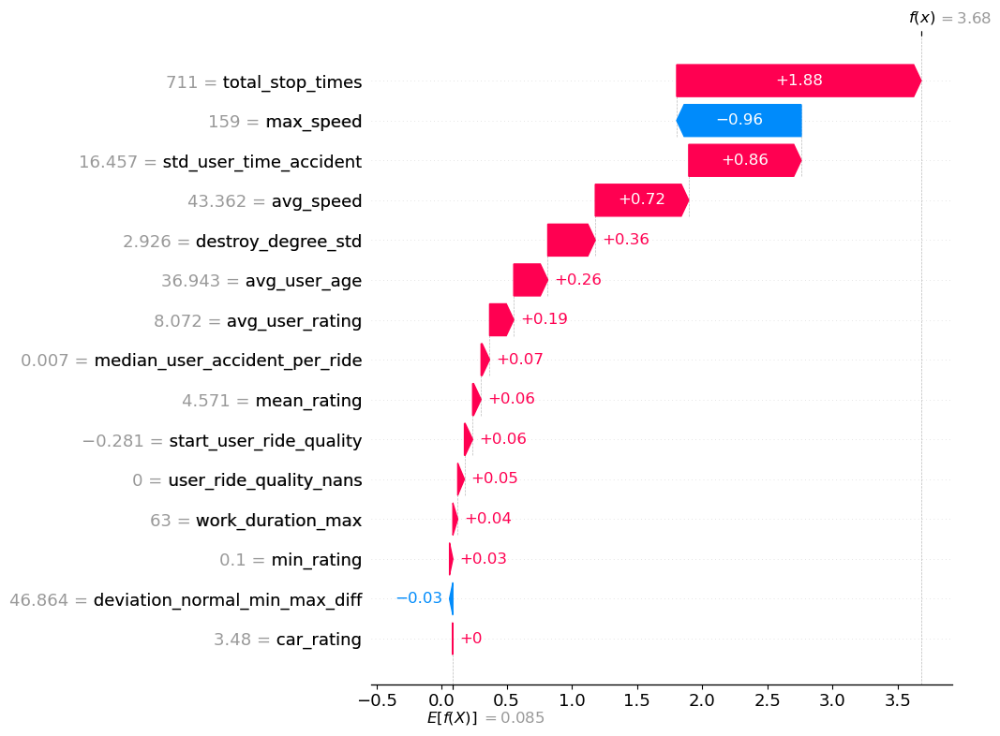

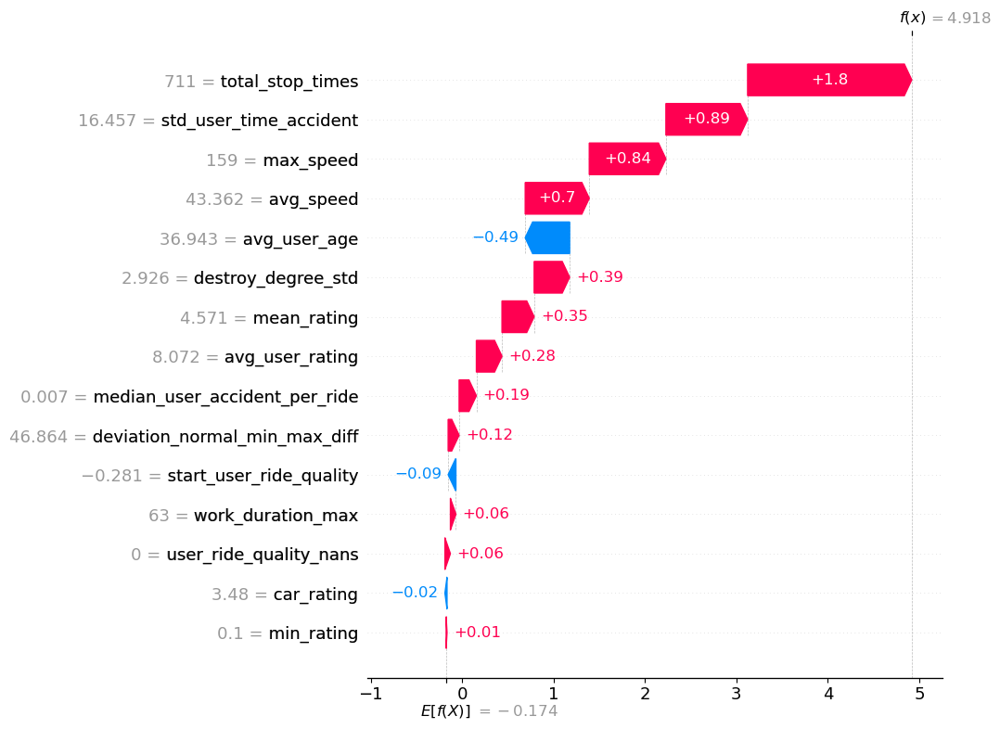

In [71]:
shap.waterfall_plot(s_values[293][:, 0], max_display=20)
shap.waterfall_plot(s_values[293][:, 8], max_display=20)

Max_speed значительно потянул в противоположную от класса 0 сторону, и в итоге получил преобладание класс 8.

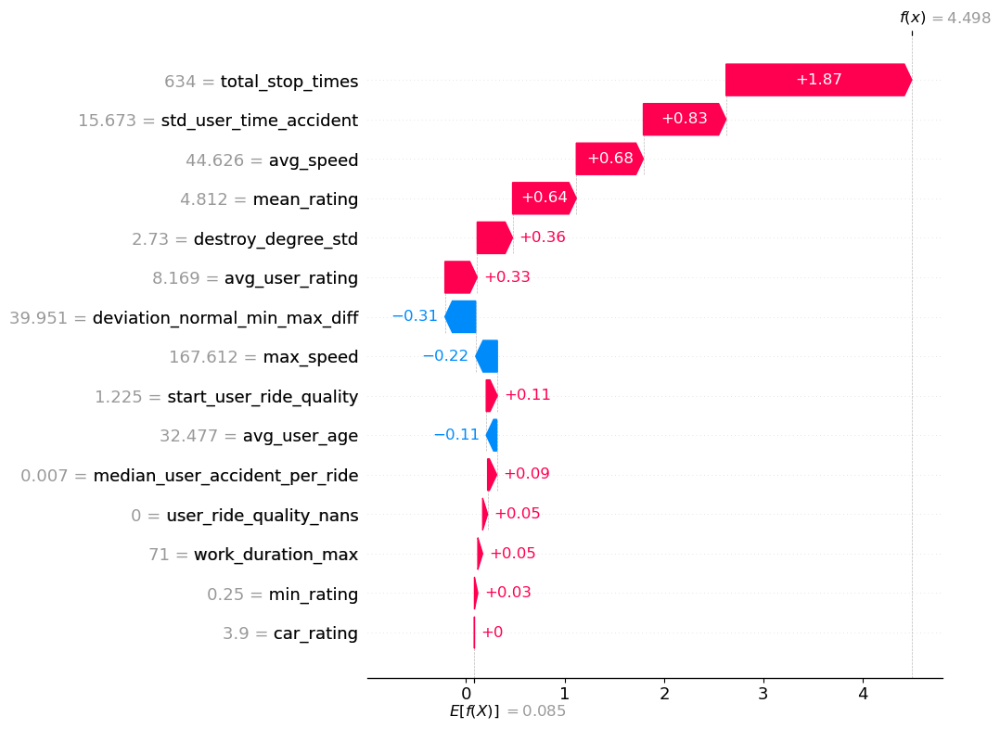

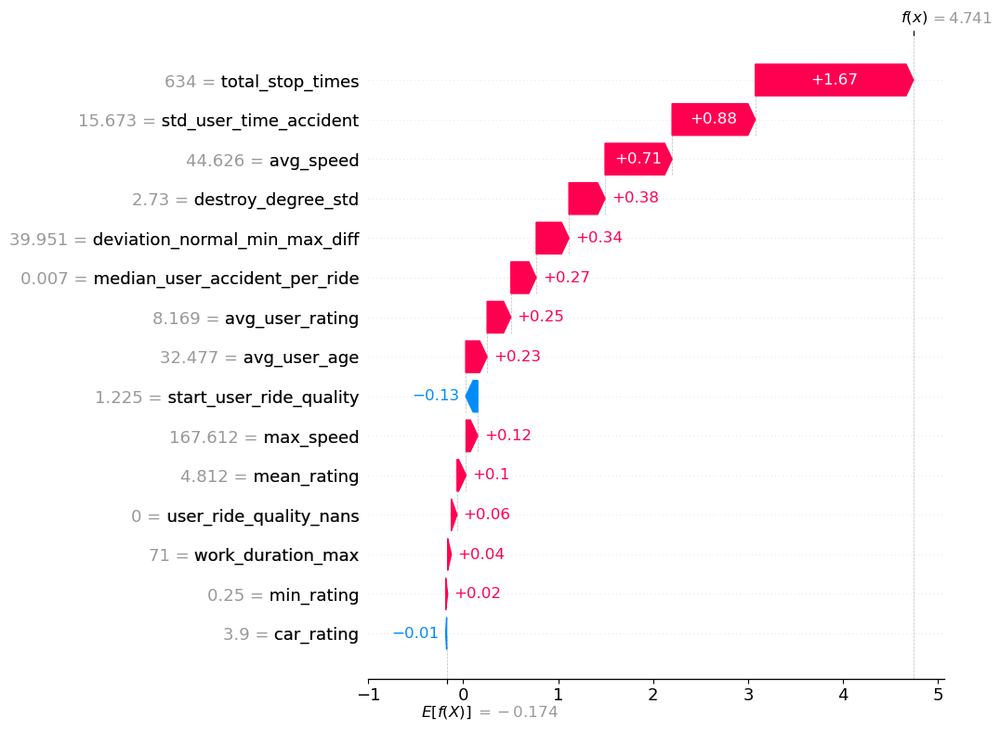

In [72]:
shap.waterfall_plot(s_values[618][:, 0], max_display=20)
shap.waterfall_plot(s_values[618][:, 8], max_display=20)

В строке 618 небольшой перевес оказался у класса 8, в противоположную от класса 0 сторону потянули признаки max_speed и deviation_normal_min_max_diff.  

Waterfall plot показал влияние тех или иных признаков на принятие решения по выбору того или иного класса. max_speed, как видно из других визуализаций важности признаков (shap, feature importance) также важен для предсказаний классов, оставим это.

# Домашнее задание 3. Оптимизация. Тюнинг гиперпараметров с помощью `Optuna`

<div class="alert alert-info">

**Цель блока** — улучшить качество предсказания, произведя подбор гиперпараметров для модели с помощью `Optuna`.

## Подбор гиперпараметров (3 балла)

1. Напишите `objective` функцию и запустите `Optuna`.
2. Подберите гиперпараметры для `CatBoostClassifier` (минимум 3).
3. Обучите модель с новыми гиперпараметрами, сравните качество и сделайте выводы.

    
<h4> Критерии оценивания </h4>
    
- 1 балл за каждый корректно выполненный пункт.
    
</div>

In [42]:
#!pip install optuna -q

In [46]:
#!pip install optuna-integration -q

In [43]:
import optuna
from catboost import CatBoostClassifier
from sklearn.model_selection import KFold, train_test_split
from optuna.integration import CatBoostPruningCallback
from sklearn.metrics import accuracy_score

In [ ]:
# Подготовка данных. Выделение X и y, разделение данных на обучающую и валидационную выборки с random state
# X = car_train_features[num_features]
# y = car_train_features['target_class']
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [44]:
# Функция определения гиперпараметров для поиска и обучение модели CatBoostClassifier
def fit_catboost(trial, train, val):
    X_train, y_train = train
    X_val, y_val = val

    param = {
        'iterations': 3000,
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.01),
        'l2_leaf_reg': trial.suggest_int('l2_leaf_reg', 2, 50),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.01, 0.8),
        
        'auto_class_weights': trial.suggest_categorical('auto_class_weights', ['SqrtBalanced', 'Balanced', 'None']),
        'depth': trial.suggest_int('depth', 3, 9),
        
        'boosting_type': trial.suggest_categorical('boosting_type', ['Ordered', 'Plain']),
        'bootstrap_type': trial.suggest_categorical('bootstrap_type', ['Bayesian', 'Bernoulli', 'MVS']),
        'used_ram_limit': '14gb',
        'eval_metric': 'Accuracy',
    }

    
    if param['bootstrap_type'] == 'Bayesian':
        param['bagging_temperature'] = trial.suggest_float('bagging_temperature', 0, 20)
        
    elif param['bootstrap_type'] == 'Bernoulli':
        param['subsample'] = trial.suggest_float('subsample', 0.1, 1)
        

    clf = CatBoostClassifier(
        **param,
        thread_count=-1,
        random_seed=42
    )

    clf.fit(
        X_train,
        y_train,
        eval_set=(X_val, y_val),
        verbose=0,
        plot=False,
        early_stopping_rounds=5,
    )

    y_pred = clf.predict(X_val)
    return clf, y_pred

In [45]:
# Функция objective, в которую помещена KFold валидация, чтобы подбирать оптимальные гиперпараметры на датасете
def objective(trial, return_models=False):
    n_splits = 3
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
    X_train = car_train_features[num_features]
    y_train = car_train_features['target_class']

    scores, models = [], []
    
    for train_idx, valid_idx in kf.split(X_train):
        train_data = X_train.iloc[train_idx, :], y_train.iloc[train_idx]
        valid_data = X_train.iloc[valid_idx, :], y_train.iloc[valid_idx]

        # Подаем trials для перебора
        model, y_pred = fit_catboost(trial, train_data, valid_data) # Определили выше
        scores.append(accuracy_score(y_pred, valid_data[1]))
        models.append(model)
        break
         

    result = np.mean(scores)
    
    if return_models:
        return result, models
    else:
        return result

In [48]:
# Запуск Optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective,
               n_trials=600,
               n_jobs = 1,
               show_progress_bar=True,)

[I 2024-03-20 09:55:00,786] A new study created in memory with name: no-name-7212d5b8-10c1-43eb-b7ea-5e65e6dc04f4


  0%|          | 0/600 [00:00<?, ?it/s]

[I 2024-03-20 09:55:03,117] Trial 0 finished with value: 0.993581514762516 and parameters: {'learning_rate': 0.004771294883129112, 'l2_leaf_reg': 23, 'colsample_bylevel': 0.6847509139256305, 'auto_class_weights': 'SqrtBalanced', 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9083818591213477}. Best is trial 0 with value: 0.993581514762516.
[I 2024-03-20 09:55:03,552] Trial 1 finished with value: 0.9871630295250321 and parameters: {'learning_rate': 0.008774338272427639, 'l2_leaf_reg': 48, 'colsample_bylevel': 0.7394893556005919, 'auto_class_weights': 'SqrtBalanced', 'depth': 5, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 2.646052142399953}. Best is trial 0 with value: 0.993581514762516.
[I 2024-03-20 09:55:03,976] Trial 2 finished with value: 0.9165596919127086 and parameters: {'learning_rate': 0.008983496966014214, 'l2_leaf_reg': 38, 'colsample_bylevel': 0.04360601459283764, 'auto_class_weights': 'Balanced', 'depth

[I 2024-03-20 09:55:49,223] Trial 22 finished with value: 0.982028241335045 and parameters: {'learning_rate': 0.004926726579950591, 'l2_leaf_reg': 19, 'colsample_bylevel': 0.5201844406572907, 'auto_class_weights': 'SqrtBalanced', 'depth': 5, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.6934642048915035}. Best is trial 12 with value: 0.9948652118100129.
[I 2024-03-20 09:55:50,703] Trial 23 finished with value: 0.9961489088575096 and parameters: {'learning_rate': 0.003652481320867755, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.6692491977160951, 'auto_class_weights': 'SqrtBalanced', 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.904042047096973}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 09:55:51,635] Trial 24 finished with value: 0.9871630295250321 and parameters: {'learning_rate': 0.0032024396117508345, 'l2_leaf_reg': 7, 'colsample_bylevel': 0.6647258111402808, 'auto_class_weights': 'SqrtBalanced', 'depth

[I 2024-03-20 09:56:48,680] Trial 44 finished with value: 0.9922978177150192 and parameters: {'learning_rate': 0.003493767708460895, 'l2_leaf_reg': 40, 'colsample_bylevel': 0.7511791838755449, 'auto_class_weights': 'Balanced', 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 14.91697877393592}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 09:56:50,332] Trial 45 finished with value: 0.993581514762516 and parameters: {'learning_rate': 0.00405688562685317, 'l2_leaf_reg': 27, 'colsample_bylevel': 0.589916733261245, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8785969244151989}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 09:56:51,554] Trial 46 finished with value: 0.993581514762516 and parameters: {'learning_rate': 0.005647657426129252, 'l2_leaf_reg': 26, 'colsample_bylevel': 0.5448649736830062, 'auto_class_weights': 'SqrtBalanced', 'depth'

[I 2024-03-20 09:57:36,169] Trial 67 finished with value: 0.9884467265725289 and parameters: {'learning_rate': 0.005115646665049346, 'l2_leaf_reg': 8, 'colsample_bylevel': 0.679034434091523, 'auto_class_weights': 'None', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9519072005537333}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 09:57:36,759] Trial 68 finished with value: 0.9897304236200257 and parameters: {'learning_rate': 0.00420902461823971, 'l2_leaf_reg': 21, 'colsample_bylevel': 0.42360161937187746, 'auto_class_weights': 'SqrtBalanced', 'depth': 6, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7792755401793121}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 09:57:39,395] Trial 69 finished with value: 0.993581514762516 and parameters: {'learning_rate': 0.0048156738146530095, 'l2_leaf_reg': 12, 'colsample_bylevel': 0.5033224328089556, 'auto_class_weights': 'Balanced', 'depth': 7, 'boos

[I 2024-03-20 09:58:18,957] Trial 90 finished with value: 0.9858793324775353 and parameters: {'learning_rate': 0.008910998574308883, 'l2_leaf_reg': 33, 'colsample_bylevel': 0.6177880381242615, 'auto_class_weights': 'SqrtBalanced', 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.6626420303173596}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 09:58:20,628] Trial 91 finished with value: 0.9910141206675225 and parameters: {'learning_rate': 0.004208936442617793, 'l2_leaf_reg': 30, 'colsample_bylevel': 0.649387323703046, 'auto_class_weights': 'Balanced', 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.5342371429823343}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 09:58:21,586] Trial 92 finished with value: 0.993581514762516 and parameters: {'learning_rate': 0.008629349862489474, 'l2_leaf_reg': 28, 'colsample_bylevel': 0.5592326099474825, 'auto_class_weights': 'SqrtBalanced', 'depth': 

[I 2024-03-20 09:58:57,759] Trial 113 finished with value: 0.9948652118100129 and parameters: {'learning_rate': 0.00432001371585799, 'l2_leaf_reg': 7, 'colsample_bylevel': 0.41075919742195877, 'auto_class_weights': 'SqrtBalanced', 'depth': 4, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9325501172231324}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 09:58:58,233] Trial 114 finished with value: 0.982028241335045 and parameters: {'learning_rate': 0.003760775666942648, 'l2_leaf_reg': 7, 'colsample_bylevel': 0.39726138434818026, 'auto_class_weights': 'SqrtBalanced', 'depth': 4, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.6642346473278002}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 09:58:59,446] Trial 115 finished with value: 0.9897304236200257 and parameters: {'learning_rate': 0.004017437792582217, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.411618049566036, 'auto_class_weights': 'SqrtBalanced', 'dep

[I 2024-03-20 09:59:20,284] Trial 136 finished with value: 0.982028241335045 and parameters: {'learning_rate': 0.00598529140590319, 'l2_leaf_reg': 23, 'colsample_bylevel': 0.4519194467592665, 'auto_class_weights': 'SqrtBalanced', 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 09:59:20,937] Trial 137 finished with value: 0.9884467265725289 and parameters: {'learning_rate': 0.00547467374444758, 'l2_leaf_reg': 5, 'colsample_bylevel': 0.22143009998694246, 'auto_class_weights': 'SqrtBalanced', 'depth': 4, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.531646253845373}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 09:59:21,747] Trial 138 finished with value: 0.9858793324775353 and parameters: {'learning_rate': 0.009273348449906602, 'l2_leaf_reg': 32, 'colsample_bylevel': 0.3472599883031714, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Plain', 'bootstra

[I 2024-03-20 10:00:35,219] Trial 160 finished with value: 0.9884467265725289 and parameters: {'learning_rate': 0.009578383177829091, 'l2_leaf_reg': 27, 'colsample_bylevel': 0.7857424798869399, 'auto_class_weights': 'SqrtBalanced', 'depth': 9, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:00:37,929] Trial 161 finished with value: 0.9897304236200257 and parameters: {'learning_rate': 0.004081962201044722, 'l2_leaf_reg': 28, 'colsample_bylevel': 0.7759082568941231, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:00:40,804] Trial 162 finished with value: 0.993581514762516 and parameters: {'learning_rate': 0.004196608215760488, 'l2_leaf_reg': 27, 'colsample_bylevel': 0.7596786339118125, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 2

[I 2024-03-20 10:01:50,661] Trial 184 finished with value: 0.9897304236200257 and parameters: {'learning_rate': 0.0039726916257268674, 'l2_leaf_reg': 26, 'colsample_bylevel': 0.5287920074937577, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:01:51,850] Trial 185 finished with value: 0.993581514762516 and parameters: {'learning_rate': 0.004470367587091139, 'l2_leaf_reg': 22, 'colsample_bylevel': 0.7751264531107657, 'auto_class_weights': 'SqrtBalanced', 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:01:55,237] Trial 186 finished with value: 0.9743260590500642 and parameters: {'learning_rate': 0.0050244270507239005, 'l2_leaf_reg': 25, 'colsample_bylevel': 0.7153219958796482, 'auto_class_weights': 'SqrtBalanced', 'depth': 7, 'boosting_type': 'Ordered', 'bootstrap_type': 'MVS'}. Best is tri

[I 2024-03-20 10:02:57,012] Trial 208 finished with value: 0.9922978177150192 and parameters: {'learning_rate': 0.004809587626805553, 'l2_leaf_reg': 28, 'colsample_bylevel': 0.7746656549948252, 'auto_class_weights': 'SqrtBalanced', 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:02:58,016] Trial 209 finished with value: 0.9833119383825417 and parameters: {'learning_rate': 0.004363580483733994, 'l2_leaf_reg': 22, 'colsample_bylevel': 0.7627149300776468, 'auto_class_weights': 'SqrtBalanced', 'depth': 6, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:03:03,557] Trial 210 finished with value: 0.9922978177150192 and parameters: {'learning_rate': 0.005974025875399295, 'l2_leaf_reg': 31, 'colsample_bylevel': 0.6676492918542126, 'auto_class_weights': 'SqrtBalanced', 'depth': 9, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 

[I 2024-03-20 10:04:09,890] Trial 232 finished with value: 0.9871630295250321 and parameters: {'learning_rate': 0.003214375051608675, 'l2_leaf_reg': 27, 'colsample_bylevel': 0.6987944678920905, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:04:13,239] Trial 233 finished with value: 0.9948652118100129 and parameters: {'learning_rate': 0.0039881727868243825, 'l2_leaf_reg': 25, 'colsample_bylevel': 0.7396188067193993, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:04:14,900] Trial 234 finished with value: 0.9730423620025674 and parameters: {'learning_rate': 0.0038912978607012817, 'l2_leaf_reg': 28, 'colsample_bylevel': 0.6807264288596521, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is tria

[I 2024-03-20 10:05:19,402] Trial 256 finished with value: 0.993581514762516 and parameters: {'learning_rate': 0.006564945266038871, 'l2_leaf_reg': 22, 'colsample_bylevel': 0.6922284636214976, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.6758946794880731}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:05:23,503] Trial 257 finished with value: 0.9922978177150192 and parameters: {'learning_rate': 0.00624069269571097, 'l2_leaf_reg': 24, 'colsample_bylevel': 0.765670862317957, 'auto_class_weights': 'Balanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:05:24,296] Trial 258 finished with value: 0.9897304236200257 and parameters: {'learning_rate': 0.004742129020589296, 'l2_leaf_reg': 5, 'colsample_bylevel': 0.14162529603598267, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstr

[I 2024-03-20 10:06:15,138] Trial 279 finished with value: 0.9922978177150192 and parameters: {'learning_rate': 0.004414666971419304, 'l2_leaf_reg': 25, 'colsample_bylevel': 0.7881998745407555, 'auto_class_weights': 'SqrtBalanced', 'depth': 4, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.6910599408587097}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:06:17,632] Trial 280 finished with value: 0.9910141206675225 and parameters: {'learning_rate': 0.007071772283574435, 'l2_leaf_reg': 21, 'colsample_bylevel': 0.7138479154212601, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:06:18,709] Trial 281 finished with value: 0.993581514762516 and parameters: {'learning_rate': 0.009824703941296878, 'l2_leaf_reg': 27, 'colsample_bylevel': 0.7549194140574633, 'auto_class_weights': 'SqrtBalanced', 'depth': 6, 'boosting_type': 'Plain', 'b

[I 2024-03-20 10:07:12,155] Trial 302 finished with value: 0.9807445442875481 and parameters: {'learning_rate': 0.009980391792667909, 'l2_leaf_reg': 19, 'colsample_bylevel': 0.7170469581098294, 'auto_class_weights': 'SqrtBalanced', 'depth': 3, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:07:15,117] Trial 303 finished with value: 0.9833119383825417 and parameters: {'learning_rate': 0.009698616740665182, 'l2_leaf_reg': 24, 'colsample_bylevel': 0.7573927749446012, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.5019056695454527}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:07:15,945] Trial 304 finished with value: 0.9794608472400513 and parameters: {'learning_rate': 0.006342355070008488, 'l2_leaf_reg': 26, 'colsample_bylevel': 0.5117520109719739, 'auto_class_weights': 'SqrtBalanced', 'depth': 7, 'boosting_type': 'Plain', '

[I 2024-03-20 10:08:31,828] Trial 326 finished with value: 0.993581514762516 and parameters: {'learning_rate': 0.007773376981270709, 'l2_leaf_reg': 31, 'colsample_bylevel': 0.7529647541139021, 'auto_class_weights': 'SqrtBalanced', 'depth': 5, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:08:33,587] Trial 327 finished with value: 0.9858793324775353 and parameters: {'learning_rate': 0.00902203677065089, 'l2_leaf_reg': 28, 'colsample_bylevel': 0.7135924526138987, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.3720447022903143}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:08:41,845] Trial 328 finished with value: 0.9884467265725289 and parameters: {'learning_rate': 0.004482964426510284, 'l2_leaf_reg': 26, 'colsample_bylevel': 0.6292209457679154, 'auto_class_weights': 'SqrtBalanced', 'depth': 7, 'boosting_type': 'Ordered', '

[I 2024-03-20 10:09:47,194] Trial 349 finished with value: 0.9730423620025674 and parameters: {'learning_rate': 0.007293987087197562, 'l2_leaf_reg': 23, 'colsample_bylevel': 0.09819022284728307, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:09:47,941] Trial 350 finished with value: 0.9858793324775353 and parameters: {'learning_rate': 0.006389445241755143, 'l2_leaf_reg': 26, 'colsample_bylevel': 0.7696964602254276, 'auto_class_weights': 'SqrtBalanced', 'depth': 4, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.35175384815938715}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:09:50,485] Trial 351 finished with value: 0.9884467265725289 and parameters: {'learning_rate': 0.004627398071550031, 'l2_leaf_reg': 28, 'colsample_bylevel': 0.3923084908566089, 'auto_class_weights': 'SqrtBalanced', 'depth': 9, 'boosting_type': 'Plain',

[I 2024-03-20 10:10:59,046] Trial 372 finished with value: 0.993581514762516 and parameters: {'learning_rate': 0.009501439204498335, 'l2_leaf_reg': 25, 'colsample_bylevel': 0.7578378331951707, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:11:01,116] Trial 373 finished with value: 0.993581514762516 and parameters: {'learning_rate': 0.003855698730923494, 'l2_leaf_reg': 27, 'colsample_bylevel': 0.5082521885100434, 'auto_class_weights': 'SqrtBalanced', 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:11:03,058] Trial 374 finished with value: 0.9910141206675225 and parameters: {'learning_rate': 0.0032552316814274175, 'l2_leaf_reg': 16, 'colsample_bylevel': 0.41573799633234654, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsampl

[I 2024-03-20 10:12:19,563] Trial 395 finished with value: 0.993581514762516 and parameters: {'learning_rate': 0.004687802926039265, 'l2_leaf_reg': 27, 'colsample_bylevel': 0.634796442244163, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 13.705124362225174}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:12:22,915] Trial 396 finished with value: 0.9884467265725289 and parameters: {'learning_rate': 0.00668243506483205, 'l2_leaf_reg': 24, 'colsample_bylevel': 0.5190401024142609, 'auto_class_weights': 'Balanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:12:25,303] Trial 397 finished with value: 0.9922978177150192 and parameters: {'learning_rate': 0.00545818122355032, 'l2_leaf_reg': 26, 'colsample_bylevel': 0.6749015540094442, 'auto_class_weights': 'SqrtBalanced', 'depth': 7, 'boosting_type': 'Plain', 

[I 2024-03-20 10:13:09,973] Trial 419 finished with value: 0.9845956354300385 and parameters: {'learning_rate': 0.009204343122127675, 'l2_leaf_reg': 28, 'colsample_bylevel': 0.39303497714321145, 'auto_class_weights': 'SqrtBalanced', 'depth': 9, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9527440095137115}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:13:10,522] Trial 420 finished with value: 0.9807445442875481 and parameters: {'learning_rate': 0.007898072666549731, 'l2_leaf_reg': 25, 'colsample_bylevel': 0.4430717918344296, 'auto_class_weights': 'SqrtBalanced', 'depth': 4, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:13:11,388] Trial 421 finished with value: 0.9871630295250321 and parameters: {'learning_rate': 0.005748241825403565, 'l2_leaf_reg': 8, 'colsample_bylevel': 0.5047287692046855, 'auto_class_weights': 'SqrtBalanced', 'depth': 5, 'boosting_type': 'Plain', '

[I 2024-03-20 10:14:11,514] Trial 442 finished with value: 0.9884467265725289 and parameters: {'learning_rate': 0.004451436652877011, 'l2_leaf_reg': 24, 'colsample_bylevel': 0.5438247643859179, 'auto_class_weights': 'SqrtBalanced', 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:14:13,268] Trial 443 finished with value: 0.9768934531450578 and parameters: {'learning_rate': 0.00425405706908098, 'l2_leaf_reg': 30, 'colsample_bylevel': 0.7018121846927957, 'auto_class_weights': 'SqrtBalanced', 'depth': 4, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8656904630953881}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:14:16,869] Trial 444 finished with value: 0.9884467265725289 and parameters: {'learning_rate': 0.005378953400028284, 'l2_leaf_reg': 5, 'colsample_bylevel': 0.7658547538388935, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', '

[I 2024-03-20 10:15:37,492] Trial 465 finished with value: 0.9897304236200257 and parameters: {'learning_rate': 0.009980907294851946, 'l2_leaf_reg': 25, 'colsample_bylevel': 0.7701207512711589, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:15:40,154] Trial 466 finished with value: 0.9948652118100129 and parameters: {'learning_rate': 0.00957596957701562, 'l2_leaf_reg': 20, 'colsample_bylevel': 0.5732026446800201, 'auto_class_weights': 'SqrtBalanced', 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.2687141123579778}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:15:42,276] Trial 467 finished with value: 0.9871630295250321 and parameters: {'learning_rate': 0.009144131871453472, 'l2_leaf_reg': 28, 'colsample_bylevel': 0.27922190877256764, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', '

[I 2024-03-20 10:16:35,166] Trial 488 finished with value: 0.9948652118100129 and parameters: {'learning_rate': 0.006539963019614986, 'l2_leaf_reg': 26, 'colsample_bylevel': 0.7292104066023973, 'auto_class_weights': 'SqrtBalanced', 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:16:37,917] Trial 489 finished with value: 0.9910141206675225 and parameters: {'learning_rate': 0.004057541034958306, 'l2_leaf_reg': 29, 'colsample_bylevel': 0.7564805813389909, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:16:40,951] Trial 490 finished with value: 0.9948652118100129 and parameters: {'learning_rate': 0.005938295364036048, 'l2_leaf_reg': 27, 'colsample_bylevel': 0.4456366557787918, 'auto_class_weights': 'Balanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 

[I 2024-03-20 10:17:33,236] Trial 511 finished with value: 0.993581514762516 and parameters: {'learning_rate': 0.0049670909168767355, 'l2_leaf_reg': 2, 'colsample_bylevel': 0.7274696466589428, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:17:35,988] Trial 512 finished with value: 0.9948652118100129 and parameters: {'learning_rate': 0.004582831817157889, 'l2_leaf_reg': 4, 'colsample_bylevel': 0.5705797805555424, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:17:36,627] Trial 513 finished with value: 0.9884467265725289 and parameters: {'learning_rate': 0.006312364414348915, 'l2_leaf_reg': 32, 'colsample_bylevel': 0.306227841152117, 'auto_class_weights': 'SqrtBalanced', 'depth': 6, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 

[I 2024-03-20 10:18:45,766] Trial 535 finished with value: 0.9922978177150192 and parameters: {'learning_rate': 0.005314741871306118, 'l2_leaf_reg': 25, 'colsample_bylevel': 0.7192498485174962, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:18:47,639] Trial 536 finished with value: 0.993581514762516 and parameters: {'learning_rate': 0.006576869183661098, 'l2_leaf_reg': 16, 'colsample_bylevel': 0.7500550433626847, 'auto_class_weights': 'SqrtBalanced', 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:18:49,471] Trial 537 finished with value: 0.9768934531450578 and parameters: {'learning_rate': 0.00623300898681051, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.7662835549009158, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample'

[I 2024-03-20 10:19:36,920] Trial 558 finished with value: 0.9948652118100129 and parameters: {'learning_rate': 0.004286731526979261, 'l2_leaf_reg': 22, 'colsample_bylevel': 0.7287445516943577, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:19:42,544] Trial 559 finished with value: 0.9948652118100129 and parameters: {'learning_rate': 0.003942014588705931, 'l2_leaf_reg': 26, 'colsample_bylevel': 0.6100127455717147, 'auto_class_weights': 'Balanced', 'depth': 9, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:19:43,421] Trial 560 finished with value: 0.993581514762516 and parameters: {'learning_rate': 0.009393256811954432, 'l2_leaf_reg': 23, 'colsample_bylevel': 0.4360764794308086, 'auto_class_weights': 'SqrtBalanced', 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 23 wi

[I 2024-03-20 10:20:39,883] Trial 581 finished with value: 0.9922978177150192 and parameters: {'learning_rate': 0.004238906769116379, 'l2_leaf_reg': 31, 'colsample_bylevel': 0.4762071121619115, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.5325404267644387}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:20:43,991] Trial 582 finished with value: 0.9910141206675225 and parameters: {'learning_rate': 0.004048280049828405, 'l2_leaf_reg': 27, 'colsample_bylevel': 0.7260218391459516, 'auto_class_weights': 'SqrtBalanced', 'depth': 8, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.5872340726586774}. Best is trial 23 with value: 0.9961489088575096.
[I 2024-03-20 10:20:46,025] Trial 583 finished with value: 0.9897304236200257 and parameters: {'learning_rate': 0.0037085249828647145, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.5750723376335484, 'auto_class_weights': 'SqrtBalanced', 

In [49]:
# Оптимальные подобранные параметры после примерно 30-минутного обучения
print('Best trial: score {}, params {}'.format(study.best_trial.value, study.best_trial.params))

Best trial: score 0.9961489088575096, params {'learning_rate': 0.003652481320867755, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.6692491977160951, 'auto_class_weights': 'SqrtBalanced', 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.904042047096973}


In [50]:
# Обучение моделей с подобранными новыми гиперпараметрами
valid_scores, models = objective(
    optuna.trial.FixedTrial(study.best_params),
    return_models=True,
)

In [51]:
valid_scores, len(models)

(0.9961489088575096, 1)

В предыдущем задании среднее Accuracy за вычетом стандартного отклонения при обучении по фолдам: 0.994, точность последней модели 0.9974.  
Обучение модели на оптимальных подобранных гиперпараметрах дало accuracy 0.9961489088575096
Результаты практически одинаковые, существенных изменений нет. Посмотрим далее на визуализацию оптимизаций и параметров, применим pruning.

In [52]:
# Датафрейм со всей историей обучения n_trials=600 с сортировкой по убыванию метрики.
trials_df = study.trials_dataframe().sort_values('value', ascending=False)
trials_df

,number,value,datetime_start,datetime_complete,duration,params_auto_class_weights,params_bagging_temperature,params_boosting_type,params_bootstrap_type,params_colsample_bylevel,params_depth,params_l2_leaf_reg,params_learning_rate,params_subsample,state
584,584,0.996149,2024-03-20 10:20:46.030559,2024-03-20 10:20:48.408554,0 days 00:00:02.377995,SqrtBalanced,NaN,Plain,Bernoulli,0.683581,8,28,0.008300,0.444989,COMPLETE
573,573,0.996149,2024-03-20 10:20:08.435557,2024-03-20 10:20:11.056554,0 days 00:00:02.620997,SqrtBalanced,NaN,Plain,Bernoulli,0.745865,8,27,0.004328,0.536872,COMPLETE
224,224,0.996149,2024-03-20 10:03:42.621172,2024-03-20 10:03:46.453851,0 days 00:00:03.832679,SqrtBalanced,NaN,Plain,MVS,0.730164,8,26,0.003314,NaN,COMPLETE
228,228,0.996149,2024-03-20 10:03:52.884922,2024-03-20 10:03:56.815019,0 days 00:00:03.930097,SqrtBalanced,NaN,Plain,MVS,0.729732,8,27,0.003595,NaN,COMPLETE
23,23,0.996149,2024-03-20 09:55:49.226274,2024-03-20 09:55:50.701272,0 days 00:00:01.474998,SqrtBalanced,NaN,Plain,Bernoulli,0.669249,7,9,0.003652,0.904042,COMPLETE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2,2,0.916560,2024-03-20 09:55:03.555997,2024-03-20 09:55:03.976995,0 days 00:00:00.420998,Balanced,NaN,Ordered,MVS,0.043606,3,38,0.008983,NaN,COMPLETE
190,190,0.833119,2024-03-20 10:01:58.791289,2024-03-20 10:01:59.018290,0 days 00:00:00.227001,SqrtBalanced,NaN,Plain,MVS,0.060617,7,23,0.009233,NaN,COMPLETE
8,8,0.829268,2024-03-20 09:55:08.898998,2024-03-20 09:55:09.070997,0 days 00:00:00.171999,SqrtBalanced,10.575556,Plain,Bayesian,0.065068,3,4,0.005998,NaN,COMPLETE
9,9,0.228498,2024-03-20 09:55:09.074999,2024-03-20 09:55:09.228000,0 days 00:00:00.153001,Balanced,7.139472,Plain,Bayesian,0.024148,9,50,0.003083,NaN,COMPLETE


In [53]:
# Визуализация истории изменения от числа испытаний
optuna.visualization.plot_optimization_history(study)

Линия лучшего значения довольно быстро достигает определенного высокого уровня и остается стабильной, что дает хорошие результаты, и дальнейшее улучшение происходит несущественно или вообще не наблюдается. Также большинство trials близко к лучшему значению.

In [54]:
# Зависимость в разрере по параметрам
params = ['l2_leaf_reg', 'colsample_bylevel', 'bagging_temperature', 'depth', 'bootstrap_type', 'subsample']
optuna.visualization.plot_slice(study,
                                params=params,
                                target_name = 'accuracy_score')

bagging_temperature - большинство лучших испытаний сосредоточены вокруг низких значений bagging_temperature.  
bootstrap_type - не показывает значительной разницы в влиянии на точность, т.к. точки практически равномерно распределены между различными типами, чуть лучше Bernoulli.  
colsample_bylevel - лучшие результаты значений метрики достигаются по всему диапазону параметра, начиная с 0.1.  
depth - наблюдается тенденция к увеличению точности с увеличением глубины до определенного порога, после чего точность стабилизируется или даже уменьшается.  
l2_leaf_reg - видно, что более высокая регуляризация не всегда соответствует более высокой точности, оптимальное значение где-то в первой половине диапазона.  
subsample - не показывает явной зависимости точности от значения параметра.

In [55]:
# Важность параметров
optuna.visualization.plot_param_importances(study)

colsample_bylevel преобладающий гиперпараметр с очень высоким значением важности. Выбор доли признаков для обучения на каждом уровне дерева существенно влияет на производительность модели. l2_leaf_reg, который является параметром регуляризации L2 для листьев, и depth (глубина) также имеет некоторую важность, но она значительно меньше по сравнению с colsample_bylevel. Остальные параметры, такие как auto_class_weights, bootstrap_type, learning_rate и boosting_type, имеют очень низкую или даже незначительную важность для целевой метрики. Возможно, стоит сосредоточить внимание на более тщательной настройке colsample_bylevel, l2_leaf_reg и depth, другие параметры, могут быть зафиксированы на текущих уровнях.

In [56]:
# С применением pruning
def objective_catboost(trial):
    X = car_train_features[num_features]
    y = car_train_features['target_class']
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42
    )

    param = {
        'iterations': 3000,
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.01),
        'l2_leaf_reg': trial.suggest_int('l2_leaf_reg', 2, 17),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.01, 0.1),
        
        'auto_class_weights': trial.suggest_categorical('auto_class_weights', ['SqrtBalanced', 'Balanced', 'None']),
        'depth': trial.suggest_int('depth', 4, 9),
        
        'boosting_type': trial.suggest_categorical('boosting_type', ['Ordered', 'Plain']),
        'bootstrap_type': trial.suggest_categorical('bootstrap_type', ['Bayesian', 'Bernoulli', 'MVS']),
        'used_ram_limit': '12gb',
        
        'eval_metric': 'Accuracy',
    }

    if param['bootstrap_type'] == 'Bayesian':
        param['bagging_temperature'] = trial.suggest_float('bagging_temperature', 0, 10)
    elif param['bootstrap_type'] == 'Bernoulli':
        param['subsample'] = trial.suggest_float('subsample', 0.1, 1)

    clf = CatBoostClassifier(
        **param, thread_count=-1, random_seed=42
    )

    # Создаем объект callback
    pruning_callback = CatBoostPruningCallback(trial, 'Accuracy')

    clf.fit(
        X_train,
        y_train,
        eval_set=(X_test, y_test),
        verbose=0,
        plot=False,
        early_stopping_rounds=5,
        callbacks=[pruning_callback],
    )  # Добавляем callback в fit

    # запускаем процесс прунинга
    pruning_callback.check_pruned()

    y_pred = clf.predict(X_test)
    accuracy = accuracy_score(y_pred, y_test)
    return accuracy

In [57]:
# Запуск обучения
study = optuna.create_study(
    pruner=optuna.pruners.MedianPruner(n_warmup_steps=5),
    direction='maximize',
)

study.optimize(objective_catboost,
               n_trials=1000,
               n_jobs = 1,
               show_progress_bar=True,
              )

[I 2024-03-20 10:34:18,920] A new study created in memory with name: no-name-38d0515f-53f4-4e93-a90f-b9e50ed71070


  0%|          | 0/1000 [00:00<?, ?it/s]

C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.

C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:19,109] Trial 0 finished with value: 0.4807692307692308 and parameters: {'learning_rate': 0.002867527927025976, 'l2_leaf_reg': 8, 'colsample_bylevel': 0.01756808681860035, 'auto_class_weights': 'Balanced', 'depth': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.21363953171430655}. Best is trial 0 with value: 0.4807692307692308.
[I 2024-03-20 10:34:19,491] Trial 1 finished with value: 0.9487179487179487 and parameters: {'learning_rate': 0.009733141248503822, 'l2_leaf_reg': 2, 'colsample_bylevel': 0.07144879333171265, 'auto_class_weights': 'None', 'depth': 5, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.6991488982816922}. Best is trial 1 with value: 0.9487179487179487.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:19,882] Trial 2 finished with value: 0.8782051282051282 and parameters: {'learning_rate': 0.007149385249043944, 'l2_leaf_reg': 8, 'colsample_bylevel': 0.07387240837131963, 'auto_class_weights': 'None', 'depth': 9, 'boosting_type': 'Ordered', 'bootstrap_type': 'MVS'}. Best is trial 1 with value: 0.9487179487179487.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:20,694] Trial 3 finished with value: 0.9358974358974359 and parameters: {'learning_rate': 0.009959226914232157, 'l2_leaf_reg': 15, 'colsample_bylevel': 0.06059523603168965, 'auto_class_weights': 'SqrtBalanced', 'depth': 9, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7616517188263945}. Best is trial 1 with value: 0.9487179487179487.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.

C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:21,000] Trial 4 finished with value: 0.9743589743589743 and parameters: {'learning_rate': 0.009383162204083102, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.07889294517351521, 'auto_class_weights': 'Balanced', 'depth': 5, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 4.657527881529769}. Best is trial 4 with value: 0.9743589743589743.
[I 2024-03-20 10:34:21,101] Trial 5 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.

C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:21,219] Trial 6 pruned. Trial was pruned at iteration 5.
[I 2024-03-20 10:34:21,406] Trial 7 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.

C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:21,719] Trial 8 pruned. Trial was pruned at iteration 9.
[I 2024-03-20 10:34:21,816] Trial 9 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.

C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:21,987] Trial 10 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:22,231] Trial 11 pruned. Trial was pruned at iteration 5.
[I 2024-03-20 10:34:22,401] Trial 12 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:22,630] Trial 13 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.

C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:22,844] Trial 14 pruned. Trial was pruned at iteration 5.
[I 2024-03-20 10:34:23,018] Trial 15 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.

C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:23,247] Trial 16 pruned. Trial was pruned at iteration 5.
[I 2024-03-20 10:34:23,397] Trial 17 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.

C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:24,959] Trial 18 finished with value: 0.9871794871794872 and parameters: {'learning_rate': 0.001041648839260262, 'l2_leaf_reg': 6, 'colsample_bylevel': 0.08799083666288207, 'auto_class_weights': 'Balanced', 'depth': 8, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9184925836979643}. Best is trial 18 with value: 0.9871794871794872.
[I 2024-03-20 10:34:25,116] Trial 19 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.

C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:25,286] Trial 20 pruned. Trial was pruned at iteration 5.
[I 2024-03-20 10:34:26,345] Trial 21 finished with value: 0.9444444444444444 and parameters: {'learning_rate': 0.0010413742531642906, 'l2_leaf_reg': 3, 'colsample_bylevel': 0.0704427611139895, 'auto_class_weights': 'Balanced', 'depth': 8, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9370566124880894}. Best is trial 18 with value: 0.9871794871794872.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:26,907] Trial 22 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:27,228] Trial 23 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:27,547] Trial 24 pruned. Trial was pruned at iteration 6.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:27,891] Trial 25 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:28,529] Trial 26 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.

C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:29,957] Trial 27 finished with value: 0.9850427350427351 and parameters: {'learning_rate': 0.0079121329859473, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08851856350794005, 'auto_class_weights': 'Balanced', 'depth': 8, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.725066015505001}. Best is trial 18 with value: 0.9871794871794872.
[I 2024-03-20 10:34:30,124] Trial 28 pruned. Trial was pruned at iteration 6.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.

C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:30,291] Trial 29 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:30,497] Trial 30 pruned. Trial was pruned at iteration 5.
[I 2024-03-20 10:34:31,110] Trial 31 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.009435681426997512, 'l2_leaf_reg': 7, 'colsample_bylevel': 0.08482985929998713, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7086152916209363}. Best is trial 31 with value: 0.9893162393162394.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:31,531] Trial 32 pruned. Trial was pruned at iteration 6.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:32,509] Trial 33 finished with value: 0.9786324786324786 and parameters: {'learning_rate': 0.007362334972373116, 'l2_leaf_reg': 7, 'colsample_bylevel': 0.07533729975919977, 'auto_class_weights': 'Balanced', 'depth': 8, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9948590256100001}. Best is trial 31 with value: 0.9893162393162394.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:33,099] Trial 34 pruned. Trial was pruned at iteration 6.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:33,991] Trial 35 pruned. Trial was pruned at iteration 6.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:35,488] Trial 36 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006687528590675803, 'l2_leaf_reg': 6, 'colsample_bylevel': 0.09571947854116537, 'auto_class_weights': 'Balanced', 'depth': 8, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7494186838819471}. Best is trial 31 with value: 0.9893162393162394.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:35,982] Trial 37 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:36,499] Trial 38 pruned. Trial was pruned at iteration 6.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:37,105] Trial 39 pruned. Trial was pruned at iteration 6.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:37,675] Trial 40 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:38,641] Trial 41 finished with value: 0.9850427350427351 and parameters: {'learning_rate': 0.007331854794756685, 'l2_leaf_reg': 7, 'colsample_bylevel': 0.08131168786938797, 'auto_class_weights': 'Balanced', 'depth': 8, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8821637606061802}. Best is trial 31 with value: 0.9893162393162394.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:39,235] Trial 42 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:40,093] Trial 43 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:40,715] Trial 44 pruned. Trial was pruned at iteration 6.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:41,990] Trial 45 pruned. Trial was pruned at iteration 14.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:42,318] Trial 46 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:42,899] Trial 47 finished with value: 0.9508547008547008 and parameters: {'learning_rate': 0.008360974816080108, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.09751200068686107, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.18869644096790605}. Best is trial 31 with value: 0.9893162393162394.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:43,687] Trial 48 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:44,415] Trial 49 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:44,734] Trial 50 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:45,705] Trial 51 pruned. Trial was pruned at iteration 14.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:46,259] Trial 52 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:47,098] Trial 53 pruned. Trial was pruned at iteration 6.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:47,656] Trial 54 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:50,012] Trial 55 finished with value: 0.9957264957264957 and parameters: {'learning_rate': 0.007652629188936856, 'l2_leaf_reg': 6, 'colsample_bylevel': 0.08880770401386369, 'auto_class_weights': 'Balanced', 'depth': 9, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9334810475869414}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:51,380] Trial 56 pruned. Trial was pruned at iteration 6.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:52,471] Trial 57 finished with value: 0.9700854700854701 and parameters: {'learning_rate': 0.00885569223629773, 'l2_leaf_reg': 6, 'colsample_bylevel': 0.09359023845435778, 'auto_class_weights': 'Balanced', 'depth': 9, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.5979506074101476}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:53,414] Trial 58 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:54,236] Trial 59 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.004001485678585546, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.0846495891015782, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.801264665504104}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:54,511] Trial 60 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:55,165] Trial 61 finished with value: 0.9871794871794872 and parameters: {'learning_rate': 0.0014556063446921276, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08465979512361528, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8128953157870905}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:55,818] Trial 62 finished with value: 0.9871794871794872 and parameters: {'learning_rate': 0.0016688414829203572, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08493869827970339, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7774443737151012}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:56,435] Trial 63 finished with value: 0.9871794871794872 and parameters: {'learning_rate': 0.0014645884191065806, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08478780141094175, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8050334548756106}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:56,940] Trial 64 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.

C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:57,163] Trial 65 pruned. Trial was pruned at iteration 5.
[I 2024-03-20 10:34:57,342] Trial 66 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:58,228] Trial 67 finished with value: 0.9914529914529915 and parameters: {'learning_rate': 0.002487543664296934, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08507298791987723, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8303140212774942}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:58,438] Trial 68 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.

C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:58,746] Trial 69 pruned. Trial was pruned at iteration 5.
[I 2024-03-20 10:34:58,914] Trial 70 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:59,397] Trial 71 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:34:59,923] Trial 72 pruned. Trial was pruned at iteration 7.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:00,392] Trial 73 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:00,856] Trial 74 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:01,114] Trial 75 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:01,673] Trial 76 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:02,136] Trial 77 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.

C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:02,486] Trial 78 pruned. Trial was pruned at iteration 5.
[I 2024-03-20 10:35:02,683] Trial 79 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:03,231] Trial 80 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:03,881] Trial 81 finished with value: 0.9871794871794872 and parameters: {'learning_rate': 0.001507020479011997, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08548845252527065, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7903984723177916}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:04,307] Trial 82 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:04,800] Trial 83 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:05,191] Trial 84 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:05,686] Trial 85 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:05,918] Trial 86 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:06,168] Trial 87 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:06,432] Trial 88 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:07,061] Trial 89 finished with value: 0.9871794871794872 and parameters: {'learning_rate': 0.00516607014951476, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08648597478288876, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.868118873035998}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:07,549] Trial 90 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:08,142] Trial 91 finished with value: 0.9871794871794872 and parameters: {'learning_rate': 0.0016594451998933188, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08526761692464795, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.782807721102651}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:08,550] Trial 92 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:09,036] Trial 93 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:09,709] Trial 94 finished with value: 0.9871794871794872 and parameters: {'learning_rate': 0.0012007256142029146, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08490081656166233, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.5216387915547621}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:10,248] Trial 95 pruned. Trial was pruned at iteration 7.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:10,649] Trial 96 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.

C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:10,858] Trial 97 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:11,262] Trial 98 pruned. Trial was pruned at iteration 5.
[I 2024-03-20 10:35:11,446] Trial 99 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:11,982] Trial 100 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:12,601] Trial 101 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005868556551714324, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08676056385837248, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8587421233364281}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:13,045] Trial 102 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:13,983] Trial 103 finished with value: 0.9914529914529915 and parameters: {'learning_rate': 0.0061726850511369625, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08703421413831078, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9076898338658701}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:14,408] Trial 104 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:14,993] Trial 105 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:16,121] Trial 106 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:16,903] Trial 107 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:17,150] Trial 108 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:17,622] Trial 109 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:17,990] Trial 110 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:18,648] Trial 111 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.00615457146116751, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08496335833374649, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7935347992389703}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:19,069] Trial 112 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:19,646] Trial 113 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:20,625] Trial 114 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:22,018] Trial 115 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.00606293107049594, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08502258504667597, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8808295218883604}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:22,419] Trial 116 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:23,132] Trial 117 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:23,703] Trial 118 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:23,955] Trial 119 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:24,693] Trial 120 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:25,646] Trial 121 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.00580265594911899, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.0850234756267593, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8424850054733262}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:26,195] Trial 122 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:26,853] Trial 123 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:27,598] Trial 124 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005836046134644907, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08543420314046882, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8985771315222792}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:28,299] Trial 125 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005230428653257119, 'l2_leaf_reg': 6, 'colsample_bylevel': 0.08756093241587931, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9020643177597303}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:28,844] Trial 126 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:29,546] Trial 127 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005620842131820491, 'l2_leaf_reg': 5, 'colsample_bylevel': 0.08767989873533737, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8899476323956541}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:30,236] Trial 128 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.004965468379680098, 'l2_leaf_reg': 5, 'colsample_bylevel': 0.08760967454423182, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8678382585578525}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:30,777] Trial 129 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:31,222] Trial 130 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:31,836] Trial 131 finished with value: 0.9871794871794872 and parameters: {'learning_rate': 0.0051081753737399534, 'l2_leaf_reg': 4, 'colsample_bylevel': 0.0863662069702501, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8681578699425663}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:32,373] Trial 132 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:32,985] Trial 133 finished with value: 0.9871794871794872 and parameters: {'learning_rate': 0.006043221423631518, 'l2_leaf_reg': 5, 'colsample_bylevel': 0.08556436245576628, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8986710260029421}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:33,564] Trial 134 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:34,060] Trial 135 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:34,309] Trial 136 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:34,579] Trial 137 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:34,812] Trial 138 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:35,207] Trial 139 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:35,735] Trial 140 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:36,354] Trial 141 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:37,085] Trial 142 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:38,099] Trial 143 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:38,403] Trial 144 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:38,686] Trial 145 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:39,028] Trial 146 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:39,538] Trial 147 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:40,280] Trial 148 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.00505399395993, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08570982599846286, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.795310977644275}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:40,757] Trial 149 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:41,289] Trial 150 pruned. Trial was pruned at iteration 7.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:41,748] Trial 151 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:42,410] Trial 152 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:42,962] Trial 153 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:43,428] Trial 154 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:43,997] Trial 155 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:44,704] Trial 156 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.003889012456282901, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08759089225178417, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9988847536508461}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:45,132] Trial 157 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:45,601] Trial 158 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:46,271] Trial 159 finished with value: 0.9871794871794872 and parameters: {'learning_rate': 0.003897083595490938, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08685497972454934, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8726117673862547}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:46,577] Trial 160 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:47,168] Trial 161 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:47,861] Trial 162 finished with value: 0.9871794871794872 and parameters: {'learning_rate': 0.005823970815098639, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08798761797228563, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8972495026279721}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:48,560] Trial 163 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005540509605827094, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08502676608151413, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7933725507944823}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:49,252] Trial 164 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005512951398675253, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08456002813141252, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7804777495418437}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:49,775] Trial 165 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:50,506] Trial 166 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006106289029006239, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08574680514733858, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7908777275902821}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:51,951] Trial 167 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:52,560] Trial 168 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:53,279] Trial 169 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:53,608] Trial 170 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:54,858] Trial 171 finished with value: 0.9914529914529915 and parameters: {'learning_rate': 0.00519394020017285, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08482444049703508, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7658823951616642}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:55,523] Trial 172 finished with value: 0.9871794871794872 and parameters: {'learning_rate': 0.005179517068688016, 'l2_leaf_reg': 8, 'colsample_bylevel': 0.08532529957944941, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7427249254263623}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:56,085] Trial 173 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:56,544] Trial 174 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:57,468] Trial 175 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.00460152260248628, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08677900631549897, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8302578133946709}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:57,903] Trial 176 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:58,485] Trial 177 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:59,120] Trial 178 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:35:59,676] Trial 179 pruned. Trial was pruned at iteration 7.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:00,161] Trial 180 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:00,948] Trial 181 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005463932709872932, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08444844234687293, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7741166782145463}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:01,728] Trial 182 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.0055426152301255895, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08687947551185929, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7837672060994217}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:02,261] Trial 183 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:02,870] Trial 184 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:03,586] Trial 185 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005357398185818753, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08545671551599462, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.695396861954261}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:04,141] Trial 186 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:05,056] Trial 187 finished with value: 0.9871794871794872 and parameters: {'learning_rate': 0.005783882231178529, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08780213428001113, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8104224710130954}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:05,641] Trial 188 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:06,385] Trial 189 finished with value: 0.9871794871794872 and parameters: {'learning_rate': 0.005187170520064365, 'l2_leaf_reg': 4, 'colsample_bylevel': 0.08635987376445384, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8482928615108771}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:07,000] Trial 190 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:07,675] Trial 191 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006161894912788023, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08546356030096755, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7939820102616901}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:08,467] Trial 192 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006045461700606603, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08740837287339269, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7882421842725021}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:09,546] Trial 193 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005997621493609946, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08535973181685189, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7624084568746181}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:10,033] Trial 194 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:10,712] Trial 195 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:11,135] Trial 196 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:11,386] Trial 197 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:11,827] Trial 198 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:12,568] Trial 199 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:12,790] Trial 200 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:13,537] Trial 201 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.004440738700783429, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.0864332698926968, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8303574858570884}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:14,264] Trial 202 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005281526462401391, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.0845395705085029, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8417723324832326}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:14,954] Trial 203 finished with value: 0.9871794871794872 and parameters: {'learning_rate': 0.004518030077392706, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08809857582495108, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8651256922798053}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:15,399] Trial 204 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:15,907] Trial 205 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:16,175] Trial 206 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:16,870] Trial 207 finished with value: 0.9871794871794872 and parameters: {'learning_rate': 0.00491743526856499, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08746587341486778, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7993974771120889}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:17,103] Trial 208 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:17,333] Trial 209 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:17,853] Trial 210 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:18,476] Trial 211 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005482700647625442, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.0848207416649632, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7749486189991346}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:19,086] Trial 212 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.009200606602157073, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08566725371165579, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7784031488855968}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:19,517] Trial 213 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:19,993] Trial 214 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:20,831] Trial 215 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:21,510] Trial 216 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.009969917118529086, 'l2_leaf_reg': 8, 'colsample_bylevel': 0.08823943555468397, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7625829334857626}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:22,035] Trial 217 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:22,463] Trial 218 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:23,057] Trial 219 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:23,525] Trial 220 pruned. Trial was pruned at iteration 7.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:24,150] Trial 221 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005433330308447827, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08677305199361526, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7831248621965536}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:24,781] Trial 222 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005679751452931661, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08559232206154481, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7907503795781482}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:25,296] Trial 223 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:25,721] Trial 224 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:26,321] Trial 225 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:26,882] Trial 226 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:27,255] Trial 227 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:27,760] Trial 228 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:28,288] Trial 229 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:28,635] Trial 230 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:29,255] Trial 231 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005346038452867438, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08628544922274213, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.6448716628114353}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:29,892] Trial 232 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005173966237463726, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.0852292718486881, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.69310496784984}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:30,579] Trial 233 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.004967766172898837, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08726142991825307, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.677628520355254}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:31,125] Trial 234 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:31,689] Trial 235 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:32,137] Trial 236 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:32,779] Trial 237 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.0052088379524788215, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08579469801148239, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7564257264681018}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.

C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:32,978] Trial 238 pruned. Trial was pruned at iteration 5.
[I 2024-03-20 10:36:33,421] Trial 239 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:33,865] Trial 240 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:34,494] Trial 241 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006190456435457765, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08625130444169339, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8023820924845677}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:35,127] Trial 242 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006133961846880008, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08502939769775288, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7895474634174006}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:35,795] Trial 243 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006586248787052184, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08777872837134248, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.774153174014352}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:36,221] Trial 244 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:36,869] Trial 245 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005754632583517387, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08597492195044126, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8536995261011053}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:37,300] Trial 246 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:37,742] Trial 247 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:38,271] Trial 248 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:38,516] Trial 249 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:38,954] Trial 250 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:39,464] Trial 251 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:39,794] Trial 252 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:40,447] Trial 253 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.00607175453839287, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08712769442168995, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7695409348077451}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:41,082] Trial 254 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.007807591112834767, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.0845633265423578, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7375839978686138}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:41,549] Trial 255 pruned. Trial was pruned at iteration 7.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:42,071] Trial 256 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:42,509] Trial 257 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:43,019] Trial 258 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:43,408] Trial 259 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.

C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:43,870] Trial 260 pruned. Trial was pruned at iteration 5.
[I 2024-03-20 10:36:44,065] Trial 261 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:44,627] Trial 262 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:45,077] Trial 263 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:45,602] Trial 264 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:46,226] Trial 265 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.00556906174086533, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08702490007039493, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8966011715178361}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:47,135] Trial 266 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:47,758] Trial 267 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:48,448] Trial 268 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:48,927] Trial 269 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:49,197] Trial 270 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:49,682] Trial 271 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:50,348] Trial 272 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:51,207] Trial 273 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.004829679181461966, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.0876887499659713, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7984304685367444}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:51,703] Trial 274 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:52,169] Trial 275 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:52,786] Trial 276 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:53,276] Trial 277 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:53,689] Trial 278 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:54,236] Trial 279 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.

C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:54,454] Trial 280 pruned. Trial was pruned at iteration 5.
[I 2024-03-20 10:36:55,065] Trial 281 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:55,335] Trial 282 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:55,634] Trial 283 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:56,246] Trial 284 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:56,741] Trial 285 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:57,524] Trial 286 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006667996370501282, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08690449968467356, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8438712907039074}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:57,813] Trial 287 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:58,505] Trial 288 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:59,104] Trial 289 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:36:59,634] Trial 290 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:00,159] Trial 291 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:00,950] Trial 292 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:01,253] Trial 293 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:01,996] Trial 294 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.009388576469469233, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08605387403216908, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9068341065290044}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:02,601] Trial 295 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:03,421] Trial 296 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.00567822180200323, 'l2_leaf_reg': 5, 'colsample_bylevel': 0.08816887861100711, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8330311823428649}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:04,072] Trial 297 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:04,584] Trial 298 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:04,970] Trial 299 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:05,494] Trial 300 pruned. Trial was pruned at iteration 7.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:05,728] Trial 301 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:06,472] Trial 302 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.004431561692779958, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08778842593669611, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9290291581457316}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:07,013] Trial 303 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:07,562] Trial 304 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:08,235] Trial 305 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:08,544] Trial 306 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:09,043] Trial 307 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:09,676] Trial 308 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:10,289] Trial 309 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:10,780] Trial 310 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:11,606] Trial 311 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005745998363312138, 'l2_leaf_reg': 8, 'colsample_bylevel': 0.08731686822643123, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8164342212826092}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:12,173] Trial 312 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:12,753] Trial 313 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:13,942] Trial 314 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:14,470] Trial 315 pruned. Trial was pruned at iteration 7.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:14,770] Trial 316 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:15,529] Trial 317 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005490049348918651, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08694872966567588, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7996030880486984}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:16,176] Trial 318 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:16,456] Trial 319 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:16,939] Trial 320 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:17,434] Trial 321 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:17,926] Trial 322 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:18,688] Trial 323 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.004870214025694986, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08807246400299518, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.6928782694940558}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:19,207] Trial 324 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:19,941] Trial 325 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:20,970] Trial 326 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:21,671] Trial 327 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.0063543920240333165, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08669007629325952, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.6644581665318091}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:21,956] Trial 328 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:22,392] Trial 329 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:22,908] Trial 330 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:23,900] Trial 331 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:24,450] Trial 332 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:25,065] Trial 333 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:25,575] Trial 334 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:26,113] Trial 335 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:26,697] Trial 336 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:27,233] Trial 337 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:27,478] Trial 338 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:28,123] Trial 339 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:28,884] Trial 340 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006096998109728847, 'l2_leaf_reg': 5, 'colsample_bylevel': 0.08736418091572454, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7704295846014682}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:29,451] Trial 341 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:29,964] Trial 342 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:30,615] Trial 343 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:31,165] Trial 344 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:31,632] Trial 345 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:32,326] Trial 346 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:33,055] Trial 347 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005337214251634995, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.0847522873833545, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7648955301152314}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:33,670] Trial 348 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:34,013] Trial 349 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:34,320] Trial 350 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:35,144] Trial 351 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.0054493613900641405, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08804562266820647, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.849323002855289}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:35,533] Trial 352 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:36,173] Trial 353 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:36,697] Trial 354 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:37,334] Trial 355 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:37,826] Trial 356 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:38,068] Trial 357 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:38,556] Trial 358 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:38,859] Trial 359 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:39,176] Trial 360 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:39,760] Trial 361 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:40,459] Trial 362 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:41,166] Trial 363 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.009234607312849141, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08643565360326089, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8529439345132791}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:41,804] Trial 364 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:42,564] Trial 365 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:43,203] Trial 366 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:43,952] Trial 367 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:44,445] Trial 368 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:45,144] Trial 369 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006127461663609396, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08582981530659378, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8403208839711994}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:45,632] Trial 370 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:46,220] Trial 371 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:46,520] Trial 372 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:47,225] Trial 373 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:47,775] Trial 374 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:48,467] Trial 375 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:48,721] Trial 376 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:49,146] Trial 377 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:49,786] Trial 378 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:50,314] Trial 379 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:50,832] Trial 380 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:51,529] Trial 381 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:51,887] Trial 382 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:52,613] Trial 383 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006492221396832731, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08671268983039626, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7722035454589639}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:53,114] Trial 384 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:53,746] Trial 385 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:54,319] Trial 386 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:55,191] Trial 387 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.008884554728972963, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08725777372930973, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8906117704531218}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:55,926] Trial 388 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:56,413] Trial 389 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:57,180] Trial 390 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006788705917476049, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08826815156394062, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8184984514894988}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:57,896] Trial 391 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005274829522887207, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.0854068530832151, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9989905856536032}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:58,435] Trial 392 pruned. Trial was pruned at iteration 7.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:58,952] Trial 393 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:59,318] Trial 394 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:59,629] Trial 395 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:37:59,952] Trial 396 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:00,754] Trial 397 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.00770187808195459, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08458331923084994, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8665452157654524}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:01,261] Trial 398 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:02,030] Trial 399 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005422689290320684, 'l2_leaf_reg': 7, 'colsample_bylevel': 0.08760468388828756, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8876370382002989}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:02,477] Trial 400 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:03,165] Trial 401 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:03,736] Trial 402 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:04,054] Trial 403 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:04,393] Trial 404 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:04,889] Trial 405 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:05,671] Trial 406 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006387550959138238, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.0881632864912833, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9041770561098786}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:06,329] Trial 407 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:06,865] Trial 408 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:07,505] Trial 409 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:08,200] Trial 410 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:08,721] Trial 411 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:09,259] Trial 412 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:09,742] Trial 413 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:10,009] Trial 414 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:10,511] Trial 415 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:10,814] Trial 416 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:11,542] Trial 417 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:12,097] Trial 418 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:12,810] Trial 419 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:13,400] Trial 420 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:14,132] Trial 421 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.00515232425967454, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08528527062801705, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8534693349347355}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:14,790] Trial 422 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:15,452] Trial 423 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:15,999] Trial 424 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:16,528] Trial 425 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:16,821] Trial 426 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:17,272] Trial 427 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:17,865] Trial 428 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:18,509] Trial 429 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:19,266] Trial 430 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.0056221887819444035, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08648928603485871, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8753674752032046}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:19,927] Trial 431 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:20,425] Trial 432 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:20,686] Trial 433 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:21,331] Trial 434 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:21,998] Trial 435 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:22,776] Trial 436 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.00587101679866196, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08780412277040905, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7675539388007816}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:23,557] Trial 437 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.00613304464358504, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08503989627216348, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8132161299834428}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:23,880] Trial 438 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:24,345] Trial 439 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:24,638] Trial 440 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:25,238] Trial 441 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:25,848] Trial 442 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:26,376] Trial 443 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:26,688] Trial 444 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:27,255] Trial 445 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:27,760] Trial 446 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:28,530] Trial 447 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:28,822] Trial 448 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:29,570] Trial 449 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:30,572] Trial 450 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:31,378] Trial 451 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:31,962] Trial 452 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:33,002] Trial 453 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.0059415670454736075, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08571737100701038, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8450767551064962}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:33,805] Trial 454 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:34,599] Trial 455 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:35,408] Trial 456 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:36,428] Trial 457 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:37,155] Trial 458 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:37,934] Trial 459 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:38,919] Trial 460 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:39,839] Trial 461 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:40,455] Trial 462 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:41,196] Trial 463 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:42,109] Trial 464 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:42,885] Trial 465 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:43,996] Trial 466 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005760554265570561, 'l2_leaf_reg': 6, 'colsample_bylevel': 0.08821363103573768, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8569157217986623}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:44,829] Trial 467 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:45,810] Trial 468 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:46,608] Trial 469 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:47,207] Trial 470 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:47,851] Trial 471 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:48,720] Trial 472 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:49,757] Trial 473 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:50,588] Trial 474 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:51,612] Trial 475 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:52,570] Trial 476 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:53,500] Trial 477 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:54,501] Trial 478 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:55,521] Trial 479 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:56,519] Trial 480 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:57,481] Trial 481 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:58,546] Trial 482 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:38:59,544] Trial 483 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:00,237] Trial 484 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:00,948] Trial 485 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:02,436] Trial 486 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:03,514] Trial 487 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:05,520] Trial 488 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:11,764] Trial 489 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:12,830] Trial 490 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:13,614] Trial 491 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:14,453] Trial 492 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:16,142] Trial 493 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.007537888344039447, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08725662796363716, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8295318555112446}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:17,516] Trial 494 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:18,531] Trial 495 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:19,635] Trial 496 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:20,703] Trial 497 pruned. Trial was pruned at iteration 7.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:21,667] Trial 498 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:22,662] Trial 499 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:23,697] Trial 500 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:24,665] Trial 501 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:26,212] Trial 502 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:27,414] Trial 503 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:28,733] Trial 504 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:29,406] Trial 505 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:30,212] Trial 506 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:31,326] Trial 507 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:32,819] Trial 508 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:34,301] Trial 509 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:34,901] Trial 510 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:35,810] Trial 511 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:37,266] Trial 512 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.004160719898026246, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08666937067036308, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7825574630210725}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:38,162] Trial 513 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:39,010] Trial 514 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:39,898] Trial 515 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:40,815] Trial 516 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:41,727] Trial 517 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:42,729] Trial 518 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:43,544] Trial 519 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:44,481] Trial 520 pruned. Trial was pruned at iteration 7.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:45,270] Trial 521 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:46,186] Trial 522 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:47,181] Trial 523 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:48,687] Trial 524 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005797668955732548, 'l2_leaf_reg': 6, 'colsample_bylevel': 0.08825734361197454, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9241130347854727}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:50,073] Trial 525 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005522283712354371, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08469419280102622, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7271613470494098}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:51,200] Trial 526 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:55,859] Trial 527 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:57,938] Trial 528 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:39:59,198] Trial 529 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:00,675] Trial 530 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:02,651] Trial 531 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:03,519] Trial 532 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:04,485] Trial 533 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:05,403] Trial 534 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:06,294] Trial 535 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:06,965] Trial 536 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:09,026] Trial 537 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:10,750] Trial 538 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005087807098238247, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08566331417672454, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7792799808842721}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:11,731] Trial 539 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:12,826] Trial 540 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:13,581] Trial 541 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:14,779] Trial 542 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.001232467661746543, 'l2_leaf_reg': 6, 'colsample_bylevel': 0.08748228221584922, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.999285949686196}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:16,361] Trial 543 pruned. Trial was pruned at iteration 7.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:17,444] Trial 544 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:18,436] Trial 545 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:19,283] Trial 546 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:19,950] Trial 547 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:21,492] Trial 548 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:22,140] Trial 549 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:23,130] Trial 550 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:24,432] Trial 551 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:25,534] Trial 552 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006890142541494577, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08477078827592721, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7352296952642816}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:26,423] Trial 553 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:27,520] Trial 554 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:29,444] Trial 555 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:30,138] Trial 556 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:30,964] Trial 557 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:31,550] Trial 558 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:32,465] Trial 559 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:33,428] Trial 560 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:34,495] Trial 561 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:35,540] Trial 562 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:40,073] Trial 563 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:40,836] Trial 564 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:41,507] Trial 565 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:42,012] Trial 566 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:42,860] Trial 567 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:43,924] Trial 568 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:44,629] Trial 569 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:45,554] Trial 570 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:46,142] Trial 571 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:46,778] Trial 572 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:47,546] Trial 573 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:48,602] Trial 574 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:49,399] Trial 575 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:50,235] Trial 576 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:51,178] Trial 577 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:52,192] Trial 578 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:53,115] Trial 579 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:54,741] Trial 580 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:55,645] Trial 581 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:56,224] Trial 582 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:56,886] Trial 583 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:57,406] Trial 584 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:58,198] Trial 585 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005718915523057459, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08724093420369755, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7422298669076528}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:58,816] Trial 586 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:59,114] Trial 587 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:40:59,796] Trial 588 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:00,364] Trial 589 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:00,841] Trial 590 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:01,566] Trial 591 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.00568061413240884, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08549066884433242, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7267095606254725}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:02,389] Trial 592 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005015509743767397, 'l2_leaf_reg': 8, 'colsample_bylevel': 0.08803875835737401, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7828081714513511}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:02,911] Trial 593 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:03,284] Trial 594 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:03,880] Trial 595 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:04,500] Trial 596 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:05,232] Trial 597 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005599916868788429, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08635225882637518, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7993791047303608}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:05,860] Trial 598 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:06,393] Trial 599 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:07,227] Trial 600 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.004491344256568428, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08824386929207996, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.6730399060211564}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:07,908] Trial 601 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:08,259] Trial 602 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:08,934] Trial 603 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:09,194] Trial 604 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:09,731] Trial 605 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:10,278] Trial 606 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:11,079] Trial 607 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006151326871298804, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08711594193400922, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8333132801540898}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:11,902] Trial 608 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005431538172998265, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.0851544441848862, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8006247895183073}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:12,485] Trial 609 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:12,944] Trial 610 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:13,472] Trial 611 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:14,071] Trial 612 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:14,412] Trial 613 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:15,086] Trial 614 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:15,484] Trial 615 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:16,084] Trial 616 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:16,786] Trial 617 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:17,446] Trial 618 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:18,005] Trial 619 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:18,550] Trial 620 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:19,244] Trial 621 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:19,869] Trial 622 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:20,387] Trial 623 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:20,635] Trial 624 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:21,144] Trial 625 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:21,878] Trial 626 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005079747162992701, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08595487230108152, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8031023505184175}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:22,531] Trial 627 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:22,896] Trial 628 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:23,621] Trial 629 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:24,283] Trial 630 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:24,846] Trial 631 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:25,837] Trial 632 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:26,372] Trial 633 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:27,026] Trial 634 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:27,814] Trial 635 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:28,165] Trial 636 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:28,509] Trial 637 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:29,039] Trial 638 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:29,708] Trial 639 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:30,310] Trial 640 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:31,063] Trial 641 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:31,393] Trial 642 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:31,987] Trial 643 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:32,571] Trial 644 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:33,183] Trial 645 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:33,499] Trial 646 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:34,298] Trial 647 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006148574017174698, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08805601306617776, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.46088752153594303}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:35,327] Trial 648 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:35,707] Trial 649 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:36,433] Trial 650 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:36,749] Trial 651 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:37,370] Trial 652 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:37,901] Trial 653 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:38,424] Trial 654 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:39,202] Trial 655 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006217030587321149, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08518011775327074, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8775849857873672}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:40,504] Trial 656 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:41,107] Trial 657 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:41,632] Trial 658 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:42,430] Trial 659 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.0014615161993202115, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08827416145894099, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9645821018330756}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:42,902] Trial 660 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:43,337] Trial 661 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:44,008] Trial 662 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:44,535] Trial 663 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:45,172] Trial 664 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:45,712] Trial 665 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:46,326] Trial 666 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:47,087] Trial 667 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006463605020030377, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08656380723581213, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8496263817324279}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:47,438] Trial 668 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:47,803] Trial 669 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:48,419] Trial 670 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:49,028] Trial 671 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:49,699] Trial 672 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:50,257] Trial 673 pruned. Trial was pruned at iteration 7.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:50,829] Trial 674 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:51,435] Trial 675 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:52,179] Trial 676 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:52,643] Trial 677 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:53,301] Trial 678 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:53,918] Trial 679 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:54,259] Trial 680 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:54,959] Trial 681 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:55,332] Trial 682 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:56,027] Trial 683 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:56,720] Trial 684 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:57,416] Trial 685 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:58,162] Trial 686 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.0068289646907423686, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08449090647636333, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8670875639698504}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:58,488] Trial 687 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:59,073] Trial 688 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:41:59,819] Trial 689 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:00,544] Trial 690 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:00,855] Trial 691 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:01,337] Trial 692 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:02,075] Trial 693 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.004849255169079457, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.0854337812242508, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.6811906839529229}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:02,602] Trial 694 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:03,369] Trial 695 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005206278780049412, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08707742043974875, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7990666585091684}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:04,051] Trial 696 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:04,601] Trial 697 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:05,140] Trial 698 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:05,428] Trial 699 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:05,977] Trial 700 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:06,327] Trial 701 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:06,911] Trial 702 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:07,294] Trial 703 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:07,998] Trial 704 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:08,682] Trial 705 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:09,147] Trial 706 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:09,808] Trial 707 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:10,438] Trial 708 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:11,027] Trial 709 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:11,782] Trial 710 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:12,409] Trial 711 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:12,726] Trial 712 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:13,474] Trial 713 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005657587533923603, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.0853299206815094, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8363425267915269}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:14,046] Trial 714 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:14,743] Trial 715 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:15,321] Trial 716 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:16,026] Trial 717 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:16,737] Trial 718 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:17,022] Trial 719 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:17,658] Trial 720 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:18,461] Trial 721 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005225169938578664, 'l2_leaf_reg': 8, 'colsample_bylevel': 0.08795811123064404, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7871605293608128}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:19,184] Trial 722 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:19,805] Trial 723 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:20,330] Trial 724 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:20,691] Trial 725 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:21,262] Trial 726 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:21,899] Trial 727 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:22,692] Trial 728 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.007823668010331896, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08506294991835288, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.6321182791071909}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:23,275] Trial 729 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:24,033] Trial 730 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:24,674] Trial 731 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:25,314] Trial 732 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:25,863] Trial 733 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:26,195] Trial 734 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:26,640] Trial 735 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:27,224] Trial 736 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:27,562] Trial 737 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:28,325] Trial 738 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:28,872] Trial 739 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:29,678] Trial 740 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.004975941454141067, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08754704075019272, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8477421146763552}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:30,623] Trial 741 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:31,453] Trial 742 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006585661949705536, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08467930762550302, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.778757209030019}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:32,011] Trial 743 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:32,684] Trial 744 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:33,379] Trial 745 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:34,152] Trial 746 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:34,674] Trial 747 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:35,242] Trial 748 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:35,885] Trial 749 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:36,471] Trial 750 pruned. Trial was pruned at iteration 7.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:37,010] Trial 751 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:37,652] Trial 752 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:37,991] Trial 753 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:38,830] Trial 754 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006784816607207272, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08779478760727223, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9310403794733797}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:39,441] Trial 755 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:39,742] Trial 756 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:40,540] Trial 757 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:41,292] Trial 758 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:41,876] Trial 759 pruned. Trial was pruned at iteration 7.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:42,424] Trial 760 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:43,217] Trial 761 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.003588731781430533, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08607263103343386, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.830304006582537}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:43,922] Trial 762 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:44,536] Trial 763 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:45,175] Trial 764 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:45,864] Trial 765 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:46,407] Trial 766 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:47,035] Trial 767 pruned. Trial was pruned at iteration 7.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:47,967] Trial 768 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.0053322290822674315, 'l2_leaf_reg': 6, 'colsample_bylevel': 0.0881134909205671, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7977192260914365}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:48,324] Trial 769 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:48,868] Trial 770 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:49,616] Trial 771 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005153002905813223, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08635403399324927, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7825915009257145}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:50,256] Trial 772 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:50,890] Trial 773 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:51,407] Trial 774 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:52,135] Trial 775 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:53,181] Trial 776 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:53,518] Trial 777 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:53,860] Trial 778 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:54,575] Trial 779 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:55,199] Trial 780 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:55,835] Trial 781 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:56,247] Trial 782 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:57,043] Trial 783 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005305839747887086, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08524854596865793, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7078310559317634}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:57,875] Trial 784 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.00593751468186779, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08779542726942591, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9663548913023244}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:58,418] Trial 785 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:58,768] Trial 786 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:42:59,456] Trial 787 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:00,093] Trial 788 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:00,751] Trial 789 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:01,451] Trial 790 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:01,821] Trial 791 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:02,474] Trial 792 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:02,768] Trial 793 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:03,549] Trial 794 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:04,310] Trial 795 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:04,868] Trial 796 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:05,695] Trial 797 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006045118035122953, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08821350034495178, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8393252823852209}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:06,249] Trial 798 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:06,799] Trial 799 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:07,515] Trial 800 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:07,886] Trial 801 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:08,649] Trial 802 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:09,486] Trial 803 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005377694476672547, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08799087456567581, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8049913027895552}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:10,038] Trial 804 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:10,796] Trial 805 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:11,464] Trial 806 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:12,100] Trial 807 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:12,662] Trial 808 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:13,389] Trial 809 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:14,024] Trial 810 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:14,584] Trial 811 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:15,182] Trial 812 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:16,134] Trial 813 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005095201440097732, 'l2_leaf_reg': 7, 'colsample_bylevel': 0.08823156874633621, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8760103006715506}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:16,920] Trial 814 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005794423140698295, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08718340109828705, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8249260849826522}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:17,619] Trial 815 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:17,908] Trial 816 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:18,534] Trial 817 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:19,138] Trial 818 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:19,778] Trial 819 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:20,429] Trial 820 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:21,206] Trial 821 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005440559723075751, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08488679603228694, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8167158282317809}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:21,569] Trial 822 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:22,131] Trial 823 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:22,805] Trial 824 pruned. Trial was pruned at iteration 7.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:23,570] Trial 825 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:24,341] Trial 826 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:24,974] Trial 827 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:25,567] Trial 828 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:26,223] Trial 829 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:26,807] Trial 830 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:27,144] Trial 831 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:27,891] Trial 832 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:28,510] Trial 833 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:28,878] Trial 834 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:29,577] Trial 835 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:30,124] Trial 836 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:30,460] Trial 837 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:31,382] Trial 838 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.003999103220024068, 'l2_leaf_reg': 5, 'colsample_bylevel': 0.08756160604062656, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.879583484595259}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:32,146] Trial 839 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:32,740] Trial 840 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:33,229] Trial 841 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:33,937] Trial 842 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:34,642] Trial 843 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:35,015] Trial 844 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:35,743] Trial 845 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:36,290] Trial 846 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:36,843] Trial 847 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:37,541] Trial 848 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:38,185] Trial 849 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:38,499] Trial 850 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:39,161] Trial 851 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:39,911] Trial 852 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:40,588] Trial 853 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:41,157] Trial 854 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:41,718] Trial 855 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:42,499] Trial 856 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005217596707781951, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08477106184492328, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8720410172524025}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:43,433] Trial 857 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005936180532315446, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08752592018013707, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8126802695997376}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:43,854] Trial 858 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:44,466] Trial 859 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:45,122] Trial 860 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:45,696] Trial 861 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:46,312] Trial 862 pruned. Trial was pruned at iteration 7.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:46,900] Trial 863 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:47,515] Trial 864 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:48,164] Trial 865 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:48,543] Trial 866 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:49,112] Trial 867 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:50,098] Trial 868 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:50,438] Trial 869 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:51,362] Trial 870 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005723901902002435, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08786225652954671, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8663250940353033}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:52,255] Trial 871 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005366752249004805, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08488126336590789, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7883617184822528}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:53,257] Trial 872 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:53,927] Trial 873 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:54,498] Trial 874 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:55,221] Trial 875 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:55,997] Trial 876 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:56,606] Trial 877 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:57,384] Trial 878 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.008705906531241453, 'l2_leaf_reg': 8, 'colsample_bylevel': 0.08566945670051879, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8546554614094335}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:57,966] Trial 879 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:58,534] Trial 880 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:58,981] Trial 881 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:43:59,885] Trial 882 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005578190527585593, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.0861828177862745, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.769709058378659}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:00,476] Trial 883 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:01,130] Trial 884 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:01,700] Trial 885 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:02,192] Trial 886 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:03,167] Trial 887 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.003907474369662869, 'l2_leaf_reg': 7, 'colsample_bylevel': 0.08473652790080625, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.45796678010458874}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:03,616] Trial 888 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:04,143] Trial 889 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:04,961] Trial 890 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:05,552] Trial 891 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:06,161] Trial 892 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:06,622] Trial 893 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:07,434] Trial 894 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:08,089] Trial 895 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:09,109] Trial 896 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:09,889] Trial 897 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.00733569808736836, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08500367496457231, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.6840531710286315}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:10,582] Trial 898 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:11,415] Trial 899 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:11,988] Trial 900 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:12,553] Trial 901 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:13,340] Trial 902 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:14,190] Trial 903 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:14,690] Trial 904 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:15,227] Trial 905 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:16,035] Trial 906 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:16,387] Trial 907 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:17,356] Trial 908 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:17,956] Trial 909 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:18,310] Trial 910 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:19,002] Trial 911 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:19,995] Trial 912 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.008324070303410827, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08638548638638954, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8153144118271665}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:20,681] Trial 913 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:21,386] Trial 914 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:22,207] Trial 915 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:23,058] Trial 916 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.0056678458073480195, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.0853979342310258, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7699898849536975}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:23,474] Trial 917 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:24,522] Trial 918 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:25,113] Trial 919 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:25,907] Trial 920 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005790333846913085, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08446507535250117, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8986804351056054}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:26,574] Trial 921 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:27,382] Trial 922 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:28,098] Trial 923 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:28,794] Trial 924 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:29,182] Trial 925 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:29,804] Trial 926 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:30,453] Trial 927 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:30,815] Trial 928 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:31,801] Trial 929 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005327896938923619, 'l2_leaf_reg': 6, 'colsample_bylevel': 0.08745053346434921, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8806870881269577}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:32,622] Trial 930 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:33,082] Trial 931 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:33,850] Trial 932 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:34,420] Trial 933 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:35,046] Trial 934 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:35,782] Trial 935 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:36,552] Trial 936 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:37,171] Trial 937 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:37,778] Trial 938 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:38,507] Trial 939 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:39,459] Trial 940 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.004868695653087625, 'l2_leaf_reg': 4, 'colsample_bylevel': 0.08728677553464174, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8927139621045865}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:40,181] Trial 941 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:40,698] Trial 942 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:41,671] Trial 943 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:42,007] Trial 944 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:43,451] Trial 945 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:43,999] Trial 946 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:44,697] Trial 947 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:45,319] Trial 948 pruned. Trial was pruned at iteration 7.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:46,203] Trial 949 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006420018893106472, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08783427977789493, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.867501731214196}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:46,759] Trial 950 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:47,539] Trial 951 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005694464164670484, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.0865506067644991, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8127294699770532}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:47,927] Trial 952 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:48,345] Trial 953 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:48,998] Trial 954 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:49,715] Trial 955 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:50,374] Trial 956 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:50,949] Trial 957 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:51,523] Trial 958 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:52,282] Trial 959 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:52,644] Trial 960 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:53,427] Trial 961 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.0063166525771821014, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.0871180270662181, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.754774698533116}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:54,009] Trial 962 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:54,384] Trial 963 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:55,033] Trial 964 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:55,605] Trial 965 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:56,010] Trial 966 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:56,597] Trial 967 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:57,316] Trial 968 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:58,119] Trial 969 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.005815056571505665, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08688699985502027, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9653486774163911}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:58,776] Trial 970 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:44:59,562] Trial 971 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.009450723547274224, 'l2_leaf_reg': 9, 'colsample_bylevel': 0.08445217521148718, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8174549420663203}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:00,114] Trial 972 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:00,650] Trial 973 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:01,022] Trial 974 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:01,384] Trial 975 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:01,970] Trial 976 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:02,810] Trial 977 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.006768424702020035, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08496239320203731, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.9359855459433606}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:03,491] Trial 978 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:04,162] Trial 979 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:05,185] Trial 980 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:05,854] Trial 981 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:06,459] Trial 982 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:06,800] Trial 983 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:07,382] Trial 984 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:08,100] Trial 985 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:08,938] Trial 986 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.00574129639473895, 'l2_leaf_reg': 11, 'colsample_bylevel': 0.08709568006510242, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7839005171442464}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:09,354] Trial 987 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:09,805] Trial 988 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:10,395] Trial 989 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:11,074] Trial 990 pruned. Trial was pruned at iteration 8.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:11,871] Trial 991 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.0063848026290375445, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.0845620562387716, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8344143237964178}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:12,451] Trial 992 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:13,199] Trial 993 pruned. Trial was pruned at iteration 11.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:14,135] Trial 994 finished with value: 0.9893162393162394 and parameters: {'learning_rate': 0.0052800694734090325, 'l2_leaf_reg': 10, 'colsample_bylevel': 0.08735376235058774, 'auto_class_weights': 'Balanced', 'depth': 6, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.7668760192390506}. Best is trial 55 with value: 0.9957264957264957.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:14,790] Trial 995 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:15,371] Trial 996 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:15,738] Trial 997 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:16,538] Trial 998 pruned. Trial was pruned at iteration 5.


C:\Users\User\AppData\Local\Temp\ipykernel_18908\3479585823.py:35: ExperimentalWarning:

CatBoostPruningCallback is experimental (supported from v3.0.0). The interface can change in the future.



[I 2024-03-20 10:45:17,305] Trial 999 pruned. Trial was pruned at iteration 11.


In [58]:
print('Number of finished trials: {}'.format(len(study.trials)))
print('Best trial:')
trial = study.best_trial
print('  Value: {}'.format(trial.value))
print('  Params: ')

for key, value in trial.params.items():
    print('    {}: {}'.format(key, value))

Number of finished trials: 1000
Best trial:
  Value: 0.9957264957264957
  Params: 
    learning_rate: 0.007652629188936856
    l2_leaf_reg: 6
    colsample_bylevel: 0.08880770401386369
    auto_class_weights: Balanced
    depth: 9
    boosting_type: Ordered
    bootstrap_type: Bernoulli
    subsample: 0.9334810475869414


Обучение уменьшилось по времени (около 30 минут без применения Pruning и 11 минут с применением Pruning). Значение accuracy на оптимально подобранных параметрах 0.9957264957264957 - метрика без изменений.

### Общая информация по `Optuna`

#### Ключевые особенности <code>Optuna</code>



- Легковесность и универсальность — можно подбирать оптимальные параметры под любые функции и метрики.
- SOTA-алгоритмы, адаптированные для поиска гиперпараметров.
- Параллелизация и различные методы прунинга.
- Встроенная визуализация.
- Интеграция со множеством популярных библиотек (бустинги, sklearn, PyTorch, W&B и другие).

Разберем Optuna по частям, чтобы понять, как ее использовать.

#### <code>Study</code>: оптимизация, базирующаяся на <code>Objective</code> функции



В `Objective`-функцию нужно написать код подсчета метрики, которую возвращаем. `Objective` вызывается Optuna много раз для подбора лучших параметров.
```python
def objective(trial, ...):
    # calculate score...
    return score
```

<h4> <code>Trial</code> — одно выполнение <code>Objective</code>-функции</h4>

В `trial`-объекте мы передаем параметры для «перебора», используя для каждого типа свой метод. Например:

```python
# метод `suggest_float` показывает, что перебираем `float` значения, от 0 и до 1.5 границы
param = trial.suggest_float('param', 0, 1.5)

# Категориальное значение
loss_function = trial.suggest_categorical('loss', ['Logloss', 'CrossEntropy'])

# Целочисленное значение
depth = trial.suggest_int('depth', 5, 8)

# Равномерное распределение
learning_rate = trial.suggest_uniform('learning_rate', 0.0, 1.0)
```

#### `Study` parameters

Инициализируем объект `study`, который начнет перебор и сохранит в себе историю результатов.
Если мы стараемся увеличить метрику, а не уменьшить ошибку, то используем `create_study(direction='maximize')`.
```python
study = optuna.create_study()
study.optimize(objective, n_trials=10)
```

<div class="alert alert-info">
    
В [`Optuna`](https://optuna.readthedocs.io/en/stable/index.html) реализовано несколько методов (`sampler`) подбора параметров (в том числе классические):
* `GridSampler`
* `RandomSampler`
* `Tree-Structed Parzen Estimator` (`TPESampler` — самый популярный, дефолтный)
* `BruteForceSampler`
* [Другие 4 метода](https://optuna.readthedocs.io/en/stable/reference/samplers/index.html#module-optuna.samplers) (можно написать собственный семплер)

### Советы по перебору параметров

- Иметь понимание важности параметров.
- Число `iterations` лучше взять с запасом и зафиксировать, при этом ограничив через `early_stopping_rounds`.
- Подсмотреть или чувствовать диапазоны и шаг значений.
- Исключить то, что перебирать не нужно (`random_seed` , `eval_metric`, `thread_count` и прочее).
- Используйте информацию с прошлых попыток.

# Домашнее задание 4. Блендинг

<div class="alert alert-info">

**Цель блока** — улучшить качество предсказания, объединив несколько моделей вместе методом блендинга.

## Задание 6. Блендинг (10 баллов)

1. Построить и обучить модели:
    - `CatBoostClassifier`,
    - `LightGBMClassifier (goss)`,
    - `XGBoostClassifier (dart)`,
    - `RandomForestClassifier`.
2. Сделать предсказания каждой моделью, оценить качество.
3. Реализовать блендинг двумя способами, оценить качество и сравнить с предыдущим пунктом:
    - `Hard Voting` —  метод, при котором делаем голосование всех моделей и выбираем самый популярный класс.
    - `Soft Voting` —  метод, при котором мы складываем вероятности предсказания всех моделей по каждому классу и потом выбираем самый класс с максимальной суммой.
    
<h4> Критерии оценивания </h4>
    
- Обучены 4 модели — 1 балл за каждую обученную модель, всего 4 балла.
- Для модели проведен подбор гиперпараметров — 0,5 балла за каждый параметр, всего 2 балла.
- Сделаны предсказания каждой модели и оценено качество — 1 балл.
- Реализован `Hard Voting` — 1 балл.
- Реализован `Soft Voting` — 1 балл.
- Сделаны выводы — 1 балл.
    
</div>

In [ ]:
# YOUR CODE HERE

### Общая информация о блендинге

**Основная идея** — взять от каждого алгоритма лучшее и совместить несколько разных ML-моделей в одну.

Что это дает:
- Увеличивается обобщающая способность финальной модели и качество улучшается.
- Модель становится более стабильной, что позволяет не слететь на приватном лидерборде.

Особенно хорошо накидывает блендинг, если смешиваемые модели имеют разную природу — например, нейронные сети, kNN и решающие деревья. Они выучивают разные зависимости и хорошо дополняют друг друга.

</div>

# <center id="part6"> Отправка финального решения на лидерборд на Kaggle

<div class="alert alert-info">

**Цель блока** — сделать предсказание с помощью блендинга для тестовой части датасета, отправить результат [в соревнование на Kaggle](https://www.kaggle.com/competitions/competative-data-science-course-by-data-feeling/overview).

## Задание 8. Предсказание на тестовом датасете и отправка на Kaggle

1. Сделать предобработку для тестового датасета, присоединить к нему информацию из других датасетов и добавить признаки, которые генерировали для тренировочного датасета.
2. Сделать предсказания каждой моделью, которую хотите включить в ансамбль, но минимум их должно быть 3.
3. Сделать блендинг с помощью `Hard Voting` или `Soft Voting` на ваш выбор.
4. Сохранить результат предсказания в `csv` файл и отправить решение на Kaggle.
    
<h4> Критерии оценивания </h4>
    
- 0 баллов за задание, если итоговый скор на лидерборде меньше чем `0.9`.
- 1 балл за каждый выполненный пункт.

</div>

In [ ]:
car_test = pd.read_csv('https://raw.githubusercontent.com/a-milenkin/Competitive_Data_Science/main/data/car_test.csv')
car_test.head(3)

In [ ]:
# YOUR CODE HERE

### Советы по отправке кода на Kaggle



Если пишете код на `Kaggle`, то для отправки решения:

1. Нажать Save Version.
2. Проверить, что в Advanced Settings выбрано «Всегда сохранять результаты ноутбука».
3. Выбрать тип сохранения Save & Run All (Commit).
4. Нажать кнопку Save.